<a href="https://colab.research.google.com/github/moerezapa/Clustering-Penyebab-Perilaku-iCheating/blob/main/iCheating.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load Library and Dataset

In [ ]:
# data pre-processing
import pandas as pd
import numpy as np
from numpy import unique
from numpy import where
# from functools import reduce # merging dataframe

# visualizating
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
from matplotlib import pyplot
# from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import re # for cleaning text like, . + =

# feature scaling
from sklearn.preprocessing import StandardScaler
# outlier detection
from sklearn.ensemble import IsolationForest

# clustering
from sklearn.cluster import AffinityPropagation # affinity propagation
from sklearn.cluster import DBSCAN # dbscan clustering
from sklearn.cluster import KMeans # KMeans
from sklearn.neighbors import NearestNeighbors

# dimentionality reduction
from sklearn.decomposition import PCA

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
dataset_user_respond = pd.read_csv("/content/drive/My Drive/iCheating/Dataset/respond.csv")

# each variable
dataset_emotional = pd.read_csv("/content/drive/My Drive/iCheating/Dataset/dataset_ei.csv")
dataset_nomophobia = pd.read_csv("/content/drive/My Drive/iCheating/Dataset/dataset_nomophobia.csv")
dataset_cb = pd.read_csv("/content/drive/My Drive/iCheating/Dataset/dataset_cb.csv")
dataset_descriptive = pd.read_csv("/content/drive/My Drive/iCheating/Dataset/descriptive.csv")

# Function

In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

In [ ]:
def replace_string(text, array_text_to_replaced):
  text1 = ''
  for word in array_text_to_replaced:
    text1 = text.replace(word, '')
    text = text1
  return text1

In [ ]:
def show_distribution_plot(data):
  plt.figure(1 , figsize = (15 , 6))
  n = 0 
  for column in data.columns:
      n += 1
      plt.subplot(1 , len(data.columns) , n)
      plt.subplots_adjust(hspace =0.5 , wspace = 1)
      sns.distplot(data[column] , bins = 20)
      plt.title('Distribusi Jawaban \'{}\''.format(column))
  plt.show()

In [ ]:
def encode_categorical(data, arraycolumn):
  for column in arraycolumn:
    data[column] = data[column].map({'Ya': 1, 'Tidak': 0})
  return data

In [ ]:
def revert_negation(data, arraycolumn):
  for column in arraycolumn:
    data[column] = data[column].map({1: 5, 2: 4, 3: 3, 4: 2, 5: 1})
  return data

In [ ]:
def get_responden_indicator_mean(data, columnindicator, arraycolumnindicator):
  data_copy = data.copy()
  for index, indicator in enumerate(columnindicator):
    data_copy[indicator] = data_copy[arraycolumnindicator[index]].mean(axis=1)
  return data_copy

# Exploratory Data Analysis

Data terdiri dari 2 jenis:

1.   Skala Likert

      Skala 1 -> Sangat Tidak Setuju
      
      Skala 2 -> Tidak Setuju
      
      Skala 3 -> B aja
      
      Skala 4 -> Setuju
      
      Skala 5 -> Sangat Setuju

2.   Deskriptif





> Retrieve Respondent's Answer



In [ ]:
respond = dataset_user_respond.drop(columns= [
                                              'Cap waktu', 
                                              'Silahkan masukan no telf atau id social media anda agar kami bisa menghubungi apabila anda beruntung',
                                              'Unnamed: 63'])

respond.rename(columns= {
    'Unnamed: 62' : 'Menurut kamu bagaimana mengatur emosi secara cerdas supaya mahasiswa dapat melakukan usaha terbaiknya dalam proses belajar mengajar'}, inplace =True)
respond.head()

# filter by iphone user
respond = respond[respond["Apakah anda pernah memiliki iPhone? "] != 'Tidak']
respond = respond.drop(columns= 'Apakah anda pernah memiliki iPhone? ')
respond.head()

,Jenis Kelamin,Dari fakultas manakah anda?,Dari Departemen Manakah Anda,Angkatan,Apakah saat ini anda sedang menggunakan iPhone sebagai Smartphone anda ?,Apakah iPhone membantu produktivitas anda,Seberapa sering anda menggunakan iPhone dalam satu hari?,Sudah berapa lama anda menjadi pengguna iPhone?,Untuk hal apa iPhone anda paling sering digunakan? (Kamu bisa pilih lebih dari satu),Saya pernah mencari bahan atau informasi secara online untuk tugas sekolah,Saya pernah membuat catatan tentang pelajaran didalamnya,Saya pernah pernah memfoto tugas teman saya,Saya pernah mengirim foto tugas saya ke teman saya,Saya mampu mengatur emosi saya sehingga saya dapat menghadapi kesulitan secara rasional,Saya cukup mampu dalam mengontrol emosi diri saya,Saya selalu dapat menenangkan diri dengan cepat ketika saya sangat marah,Saya dapat mengontrol emosi saya dengan baik,Saya tidak mampu mengatur emosi saya,Saya selalu menetapkan tujuan untuk diri saya dan mencoba yang terbaik untuk mencapainya,Saya selalu mengatakan kepada diri saya bahwa saya orang yang berkompeten,Saya adalah orang yang mampu memotivasi diri saya sendiri,Saya akan selalu mendorong diri saya untuk melakukan yang terbaik,Saya tidak mampu untuk memotivasi diri saya sendiri,"Terkadang, saya menganggap diri saya tidak baik sama sekali",Saya terkadang merasa tidak berguna,Saya merasa saya adalah orang yang sangat berguna,Saya akan merasa gugup saat saya tidak terhubung dengan identitas online saya,Saya akan merasa tidak nyaman saat saya tidak mendapatkan informasi terkini di jejaring online dan media sosial saya,Saya akan merasa canggung saat saya tidak dapat memeriksa notifikasi terkini di jejaring online saya,Saya akan merasa gelisah saat saya tidak dapat memeriksa pesan email saya,Saya akan merasa aneh saat saya tidak tahu apa yang harus dilakukan,Saya merasa tidak peduli dengan identitas online saya,Saya akan merasa gelisah saat saya tidak dapat berkomunikasi secara intens dengan keluarga/teman,Saya akan merasa cemas saat keluarga/teman saya tidak dapat menghubungi saya,Saya akan merasa gugup saat saya tidak dapat menerima pesan dan telepon,Saya akan merasa gelisah saat saya tidak dapat berhubungan (keep in touch) dengan keluarga / teman,Saya akan merasa gugup saat saya tidak tahu jika ada seseorang yang mencoba menghubungi saya,Saya akan merasa gelisah saat hubungan antara saya dengan keluarga dan teman akan terputus,Saya tidak peduli jika tahu ada yang mencoba menghubungi saya,Saya datang terlambat ke kelas karena saya ketiduran,Saya tertidur pada saat kelas pagi,Saya datang tepat waktu ke kelas,"Ketika dosen sedang tidak melihat saya, terkadang saya mengirim pesan ke teman melalui handphone yang saya letakkan di lutut untuk mencari jawaban yang benar",Ketika Semua orang mencontek di kampus. Saya pun melakukan hal yang sama,"Ketika dosen tidak memiliki kemampuan yang baik, maka saya akan mencontek dan semua orang pun melakukannya",Ketika Semua orang mencontek di kampus. Saya tidak melakukan hal yang sama,"Ketika saya tidak tahu jawaban dalam ujian, saya mencari jawaban melalui internet dengan iPhone saya",Saya menulis catatan dan rangkuman dari pelajaran dan menyimpannya di iPhone saya,"Saya menyiapkan memo dan mengunduh ke dalam iPhone saya. Ketika saya tidak mengetahui jawaban dalam ujian, secara diam – diam saya melihat iPhone untuk mencari jawabannya",Saya tidak menulis catatan dan rangkuman dari pelajaran dan menyimpannya di iPhone saya,"Ketika dosen sedang tidak memperhatikan selama ujian, kami mengirim pesan kepada teman-teman dan meminta jawaban","Ujian yang lalu sangatlah sulit. Ketika dosen sedang melihat ke arah lain, saya mengambil foto soal ujian, kemudian mengirimkan ke teman-teman di kelas lain sehingga mereka dapat memberikan jawaban yang benar kepada saya","bersama teman-teman, kami sering mencontek dengan menggunakan strategi yang sama yakni memfoto soal ujian dan mengirimkannya ke teman-teman yang melaksanakan ujian di hari lain, agar mereka dapat terba

In [ ]:
# ada 3 yang null, hilangin supaya datanya sama seperti yang di TA Tigor
respond_notnull_on_jeniskelamin = respond.dropna(subset=['Jenis Kelamin'])

In [ ]:
# take identity variable
respond_identity = respond_notnull_on_jeniskelamin.drop(columns= 'Dari Departemen Manakah Anda') # diilangin karena nggak dipake tigor
respond_identity = respond_identity.iloc[:,:12]
# respond_identity = respond_identity.iloc[:,:13]

# rename column
respond_identity.rename(columns= {
    # 'Cap waktu' : 'time',
    'Jenis Kelamin' : 'jeniskelamin',
    'Dari fakultas manakah anda?' : 'asalfakultas',
    'Apakah saat ini anda sedang menggunakan iPhone sebagai Smartphone anda ?' : 'apakah_masihmenggunakan',
    'Apakah iPhone membantu produktivitas anda' : 'membantu_produktivitas',
    'Seberapa sering anda menggunakan iPhone dalam satu hari?' : 'intensitas_penggunaan',
    'Sudah berapa lama anda menjadi pengguna iPhone?' : 'durasi_penggunaan',
    'Untuk hal apa iPhone anda paling sering digunakan? (Kamu bisa pilih lebih dari satu)' : 'kebutuhan_penggunaan',
    'Saya pernah mencari bahan atau informasi secara online untuk tugas sekolah' : 'apakah_pernah_mencariinfo',
    'Saya pernah membuat catatan tentang pelajaran didalamnya' : 'apakah_pernah_membuatcatatan',
    'Saya pernah pernah memfoto tugas teman saya' : 'apakah_pernah_fotopunyateman',
    'Saya pernah mengirim foto tugas saya ke teman saya' : 'apakah_pernah_kirimfototugas',}, inplace =True)
respond_identity = respond_identity.reset_index(drop= True)
respond_identity.head(3)

,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas
0,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,Ya,Ya,Ya,Ya
1,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,Ya,Ya,Ya,Ya
2,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,Ya,Ya,Ya,Ya


In [ ]:
# take emotional intelegent variable
respond_emotional = respond_notnull_on_jeniskelamin.iloc[:,13:26]
respond_emotional.columns = dataset_emotional.columns
respond_emotional = respond_emotional.apply(np.int64)
respond_emotional = respond_emotional.reset_index(drop= True)

In [ ]:
dataset_emotional.equals(respond_emotional)

True

In [ ]:
respond_nomophobia = respond_notnull_on_jeniskelamin.iloc[:,26:42]
respond_nomophobia.columns = dataset_nomophobia.columns
respond_nomophobia = respond_nomophobia.reset_index(drop= True)
respond_nomophobia.loc[78,'NSD1'] = dataset_nomophobia.loc[78,'NSD1']
respond_nomophobia.loc[155,'NSD1'] = dataset_nomophobia.loc[155,'NSD1']
respond_nomophobia = respond_nomophobia.apply(np.int64)

In [ ]:
dataset_nomophobia.equals(respond_nomophobia)

True

In [ ]:
respond_cb = respond_notnull_on_jeniskelamin.iloc[:,42:54]
respond_cb.columns = dataset_cb.columns
respond_cb = respond_cb.apply(np.int64)
respond_cb = respond_cb.reset_index(drop= True)

In [ ]:
dataset_cb.equals(respond_cb)

True

**Encoding Categorical Data**
> Jenis Kelamin

*   0 -> laki-laki
*   1 -> perempuan

> Pertanyaan Ya / Tidak

*   0 -> Tidak
*   1 -> Ya

> Angkatan

*   0 -> 2018
*   1 -> 2019
*   2 -> < 2017







In [ ]:
respond_identity_encode = respond_identity.copy()

In [ ]:
# converting data type to category
respond_identity_encode['jeniskelamin'] = respond_identity_encode['jeniskelamin'].astype('category')
respond_identity_encode['Angkatan'] = respond_identity_encode['Angkatan'].astype('category')

# encoding categorical
respond_identity_encode['jeniskelamin'] = respond_identity_encode['jeniskelamin'].cat.codes
respond_identity_encode['Angkatan'] = respond_identity_encode['Angkatan'].cat.codes

# encoding yes or no question
categorical_column = ['apakah_masihmenggunakan', 'membantu_produktivitas', 'apakah_pernah_mencariinfo',
                      'apakah_pernah_membuatcatatan', 'apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas']
respond_identity_encode = encode_categorical(respond_identity_encode, categorical_column)
respond_identity_encode.head()

,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas
0,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1
1,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1
2,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1
3,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1
4,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1


In [ ]:
# combine data
dataset = pd.concat([respond_identity, respond_emotional, respond_nomophobia, respond_cb], axis=1)

# combine with encoded identity data
dataset_encode = pd.concat([respond_identity_encode, respond_emotional, respond_nomophobia, respond_cb], axis=1)
dataset.head()

,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas,ROE1,ROE2,ROE3,ROE4,NROE1,UOE1,UOE2,UOE3,UOE4,NUOE,SE1,SE2,NSE1,NAI1,NAI2,NAI3,NAI4,NAI5,NNAI1,LC1,LC2,LC3,LC4,LC5,LC6,NLC1,SD1,SD2,NSD1,CA1,CA2,CA3,NCA1,CP1,CP2,CP3,NCP1,CA1.1,CA2.1,CA3.1,NCA1.1
0,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,Ya,Ya,Ya,Ya,4,5,4,5,1,4,4,4,4,5,2,2,4,2,4,2,2,2,3,2,2,2,2,4,4,4,2,2,4,4,4,4,2,4,4,4,2,2,2,2,3
1,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,Ya,Ya,Ya,Ya,4,4,4,4,2,4,4,4,4,2,2,2,4,4,4,4,3,2,2,4,4,4,4,4,4,2,2,2,4,2,2,2,4,2,4,2,2,2,2,2,4
2,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,Ya,Ya,Ya,Ya,1,1,1,1,5,4,3,2,4,4,5,5,3,5,5,5,5,5,1,5,5,5,5,5,5,1,1,1,4,5,5,5,1,5,5,5,1,1,1,1,5
3,Laki-Laki,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,< 2017,Ya,Ya,> 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Bermain Game;Men...,Ya,Ya,Ya,Ya,4,4,4,4,2,4,4,4,4,2,2,2,3,4,4,4,4,4,2,4,4,4,4,4,4,4,4,4,3,4,4,4,2,4,4,4,2,4,4,4,4
4,Laki-Laki,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),< 2017,Ya,Ya,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Mengambil Foto,Ya,Ya,Ya,Ya,3,3,2,3,3,3,3,3,4,2,3,3,2,2,2,2,2,3,2,4,4,3,4,3,4,2,4,4,2,4,4,4,2,4,4,4,2,4,4,4,1


In [ ]:
# reverse negation question
dataset_reversed = dataset.copy()
dataset_encode_reversed = dataset_encode.copy()

negation_columns = ['NROE1', 'NUOE', 'NSE1',
                    'NNAI1', 'NLC1', 'NSD1',
                    'NCA1', 'NCP1', 'NCA1.1']
dataset_reversed = revert_negation(dataset_reversed, negation_columns)
dataset_encode_reversed = revert_negation(dataset_encode_reversed, negation_columns)



> Identitas Responden



In [ ]:
jeniskelamin = dataset['jeniskelamin'].value_counts()
jeniskelamin_df = pd.DataFrame({'Jenis Kelamin': jeniskelamin.index,'values': jeniskelamin.values})

fig = px.bar(jeniskelamin_df, x='Jenis Kelamin', y='values', text='values')
fig.update_layout(title_text='Jenis Kelamin Responden')
fig.show()

In [ ]:
asal_fakultas = dataset['asalfakultas'].value_counts()
asal_fakultas_df = pd.DataFrame({'Asal Fakultas': asal_fakultas.index,'values': asal_fakultas.values})

fig = px.bar(asal_fakultas_df, x='Asal Fakultas', y='values', text='values')
fig.update_layout(title_text='Asal Fakultas Responden')
fig.show()

In [ ]:
angkatan_responden = respond_identity_encode.Angkatan.value_counts()
angkatan_responden_df = pd.DataFrame({'Angkatan': angkatan_responden.index,'values': angkatan_responden.values})

fig = px.bar(angkatan_responden_df, x='Angkatan', y='values', text='values')
fig.update_layout(title_text='Angkatan Responden (0: Angkatan 2018 , 1: Angkatan 2019, 2: Angkatan di atas 2017')
fig.show()

# Exploratory Data Analysis - Emotional Intelegent Variable



> Emotional Intelegent

Pembelajar melakukan tindakan kecurangan atau menyontek yang dipengaruhi faktor emosional



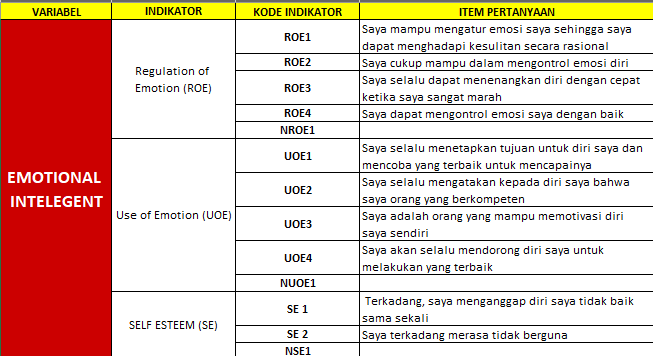


In [ ]:
data_emotional_with_identity = pd.concat([respond_identity, respond_emotional], axis=1)
emotional_reversed = dataset_reversed[dataset_emotional.columns]
# data_emotional_reversed = pd.concat((dataset_reversed[['time']], emotional_reversed), axis = 1)

# mengandung data identitas yang telah ter encode
# data_emotional_reversed_with_identity = pd.concat((respond_identity_encode, data_emotional_reversed), axis = 1)
data_emotional_reversed_with_identity = pd.concat((respond_identity_encode, emotional_reversed), axis = 1)
data_emotional_reversed_with_identity.head()

,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas,ROE1,ROE2,ROE3,ROE4,NROE1,UOE1,UOE2,UOE3,UOE4,NUOE,SE1,SE2,NSE1
0,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,5,4,5,5,4,4,4,4,1,2,2,2
1,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,4,4,2,2,2
2,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,1,1,1,1,1,4,3,2,4,2,5,5,3
3,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,4,4,2,2,3
4,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,3,3,2,3,3,3,3,3,4,4,3,3,4


In [ ]:
dataset_emotional_roe = data_emotional_with_identity[['ROE1','ROE2','ROE3','ROE4', 'NROE1']]
dataset_emotional_uoe = data_emotional_with_identity[['UOE1','UOE2','UOE3','UOE4', 'NUOE']]
dataset_emotional_se = data_emotional_with_identity[['SE1','SE2', 'NSE1']]
dataset_emotional_roe_with_identity = pd.concat([respond_identity_encode, dataset_emotional_roe], axis=1)
dataset_emotional_uoe_with_identity = pd.concat([respond_identity_encode, dataset_emotional_uoe], axis=1)
dataset_emotional_se_with_identity = pd.concat([respond_identity_encode, dataset_emotional_se], axis=1)

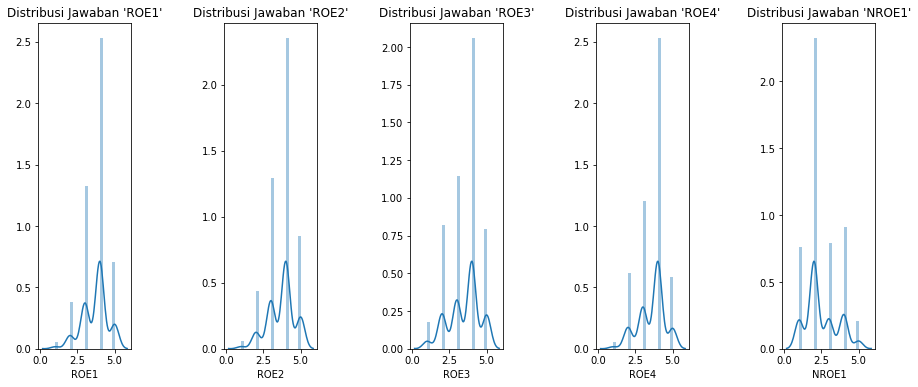

In [ ]:
show_distribution_plot(dataset_emotional_roe)

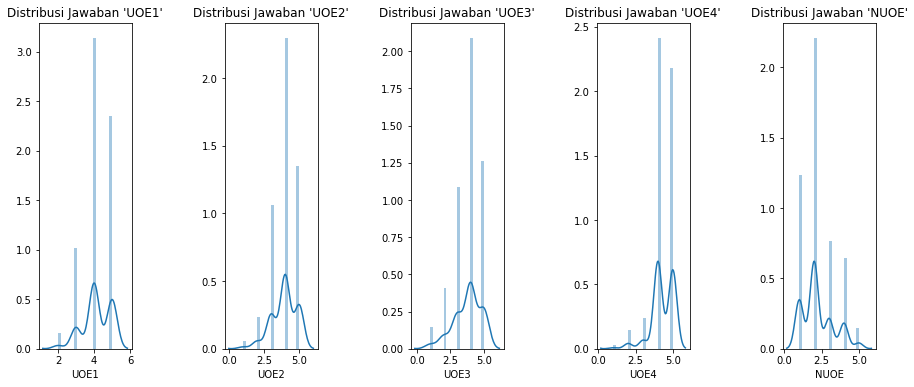

In [ ]:
show_distribution_plot(dataset_emotional_uoe)

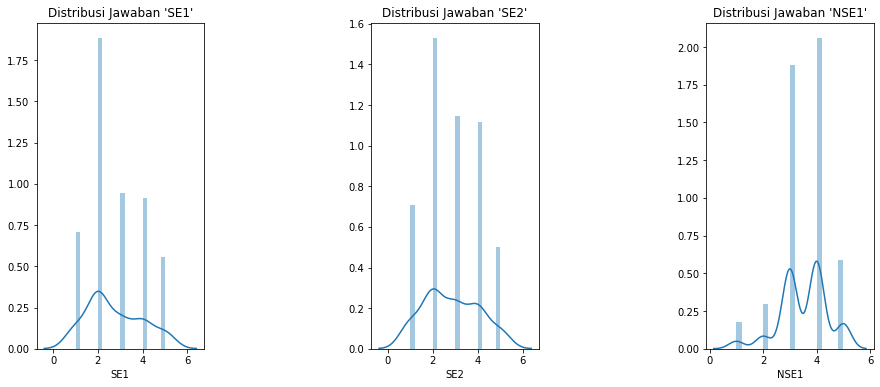

In [ ]:
show_distribution_plot(dataset_emotional_se)

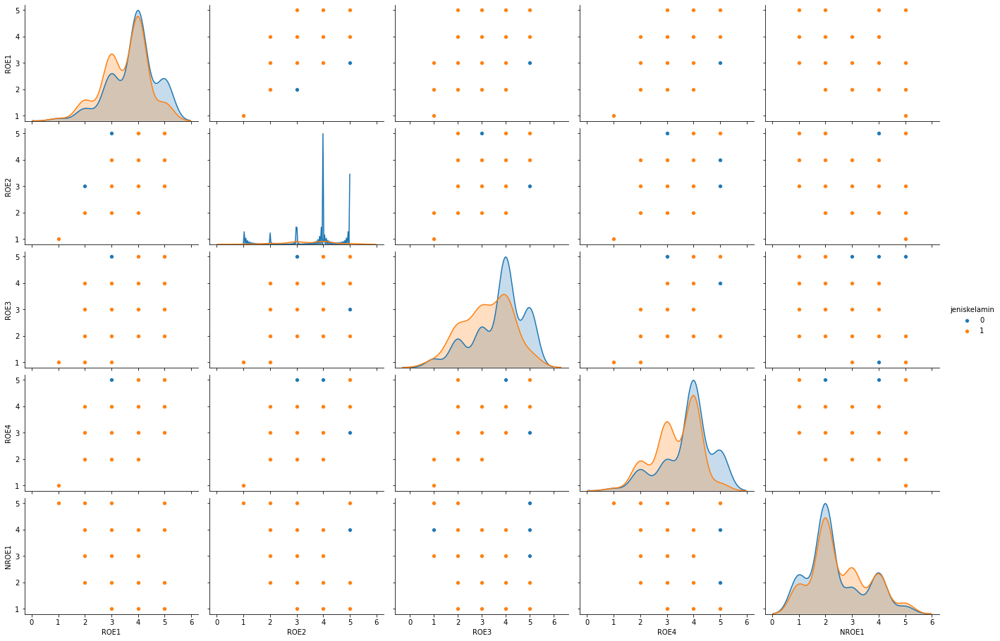

In [ ]:
# Let's see our data in a detailed way with pairplot
roe_jeniskelamin = dataset_emotional_roe_with_identity.drop(['asalfakultas', 'Angkatan', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(roe_jeniskelamin, hue='jeniskelamin', aspect=1.5)
plt.show()

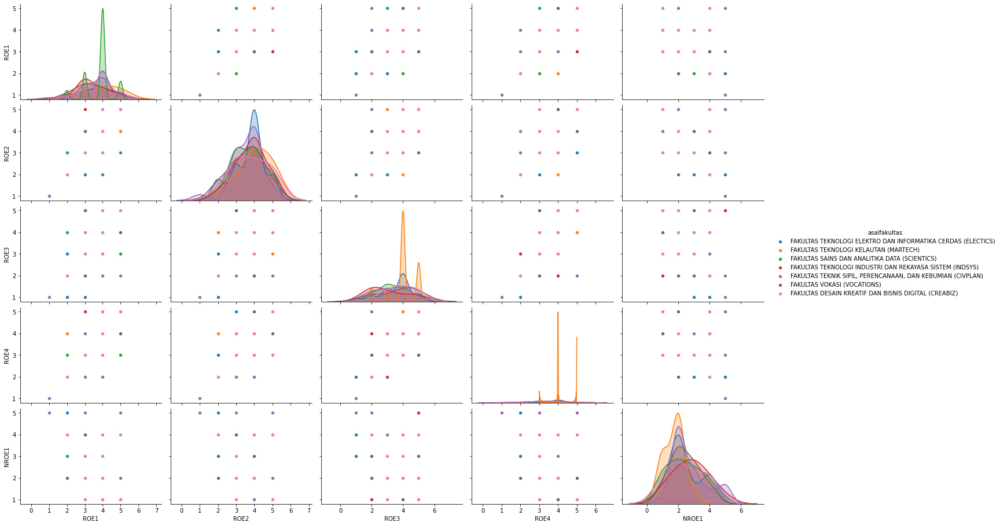

In [ ]:
# Let's see our data in a detailed way with pairplot
roe_asalfakultas = dataset_emotional_roe_with_identity.drop(['jeniskelamin', 'Angkatan', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(roe_asalfakultas, hue='asalfakultas', aspect=1.5)
plt.show()

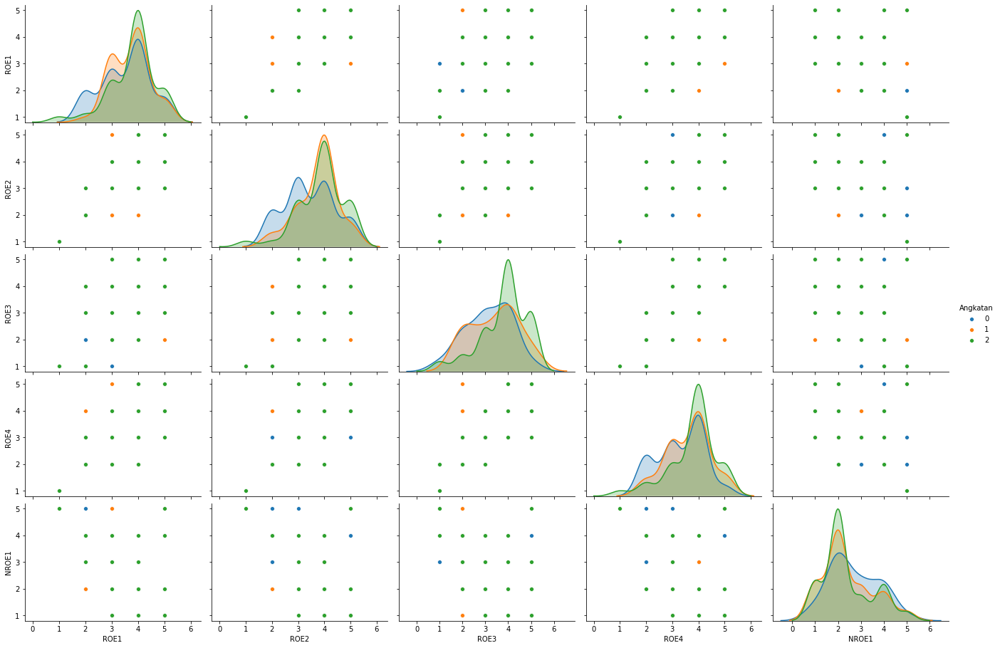

In [ ]:
# Let's see our data in a detailed way with pairplot
roe_angkatan = dataset_emotional_roe_with_identity.drop(['jeniskelamin', 'asalfakultas', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(roe_angkatan, hue='Angkatan', aspect=1.5)
plt.show()

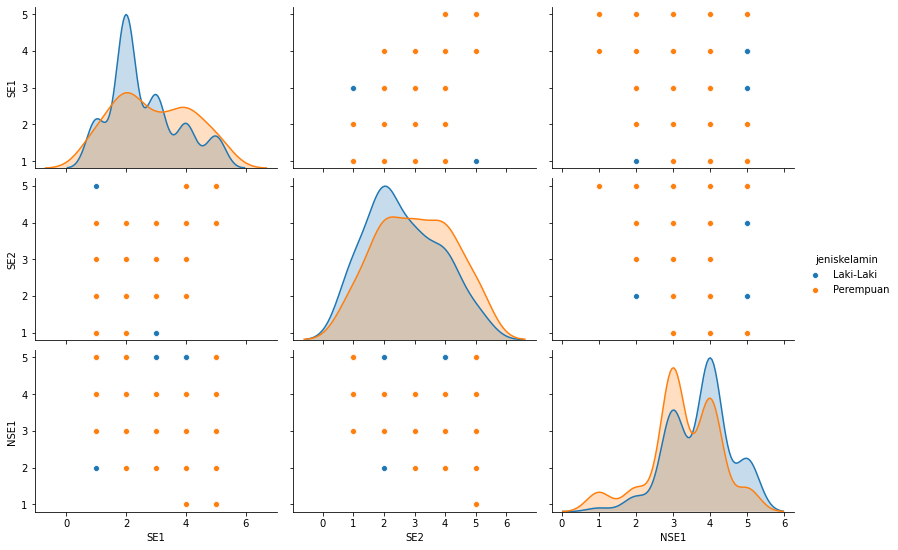

In [ ]:
# Let's see our data in a detailed way with pairplot
se_jeniskelamin = dataset_emotional_se_with_identity.drop(['asalfakultas', 'Angkatan',
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(se_jeniskelamin, hue='jeniskelamin', aspect=1.5)
plt.show()

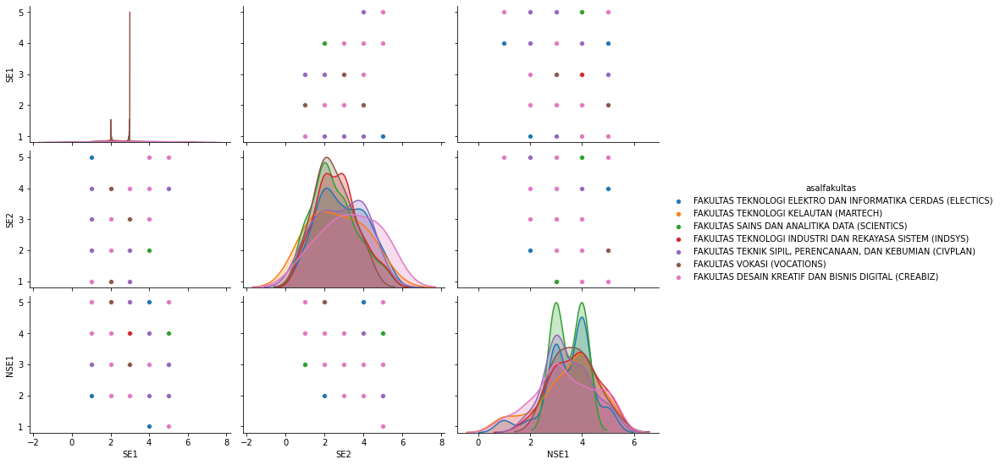

In [ ]:
# Let's see our data in a detailed way with pairplot
se_asalfakultas = dataset_emotional_se_with_identity.drop(['jeniskelamin', 'Angkatan', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(se_asalfakultas, hue='asalfakultas', aspect=1.5)
plt.show()

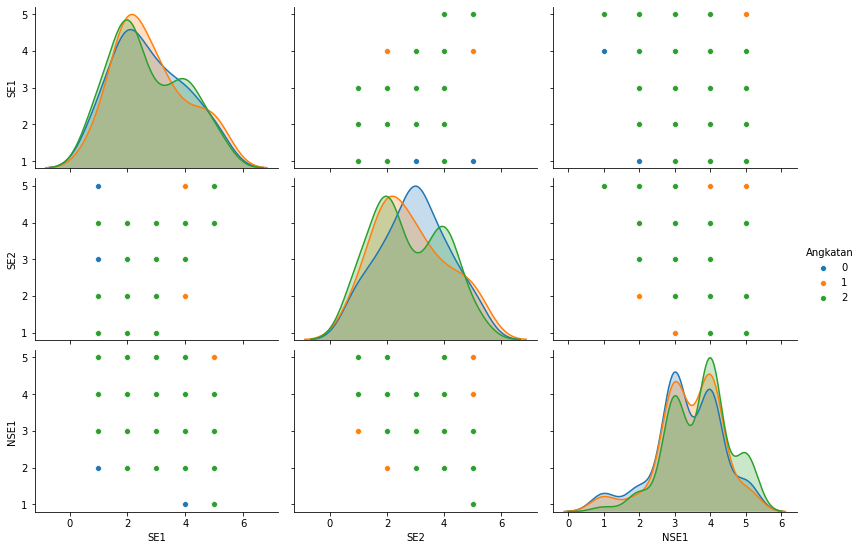

In [ ]:
# Let's see our data in a detailed way with pairplot
se_angkatan = dataset_emotional_se_with_identity.drop(['jeniskelamin', 'asalfakultas', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(se_angkatan, hue='Angkatan', aspect=1.5)
plt.show()

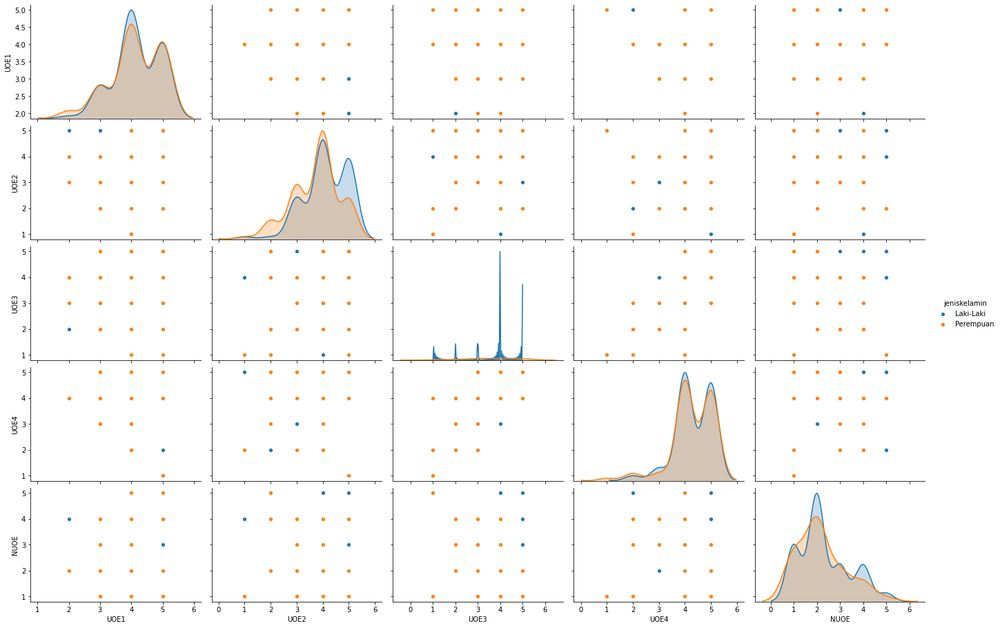

In [ ]:
# Let's see our data in a detailed way with pairplot
uoe_jeniskelamin = dataset_emotional_uoe_with_identity.drop(['asalfakultas', 'Angkatan', 'asalfakultas', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(uoe_jeniskelamin, hue='jeniskelamin', aspect=1.5)
plt.show()

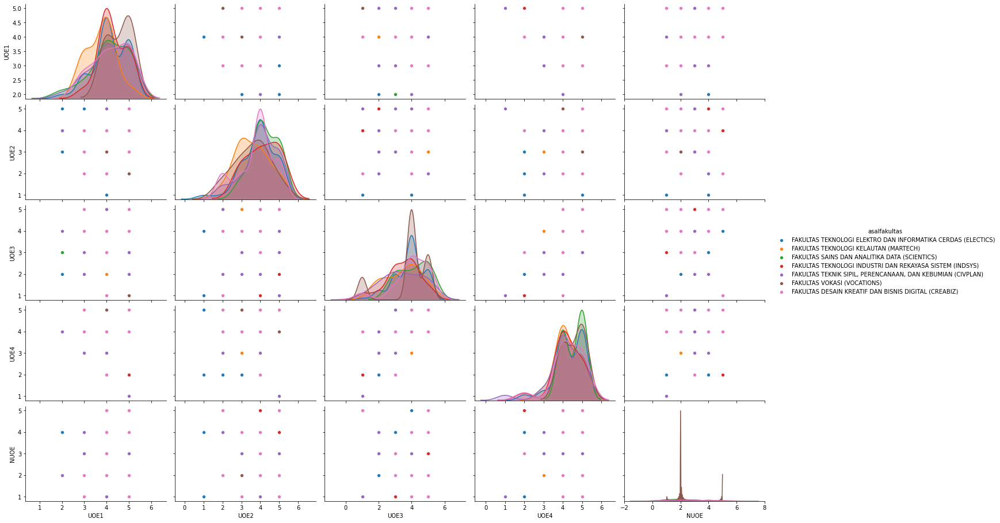

In [ ]:
# Let's see our data in a detailed way with pairplot
uoe_asalfakultas = dataset_emotional_uoe_with_identity.drop(['jeniskelamin', 'Angkatan', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(uoe_asalfakultas, hue='asalfakultas', aspect=1.5)
plt.show()

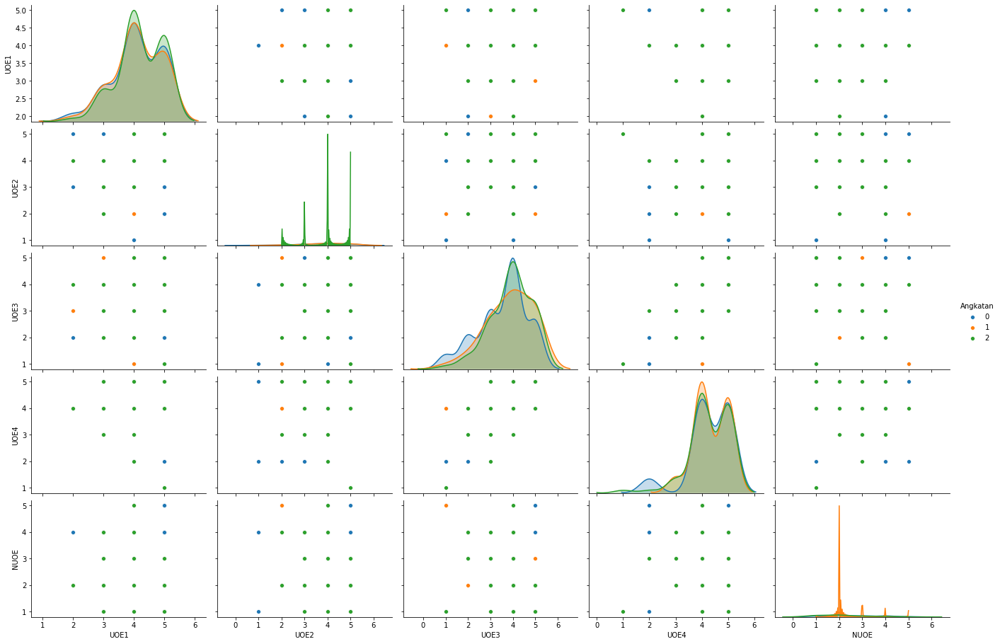

In [ ]:
# Let's see our data in a detailed way with pairplot
uoe_angkatan = dataset_emotional_uoe_with_identity.drop(['jeniskelamin', 'asalfakultas', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(uoe_angkatan, hue='Angkatan', aspect=1.5)
plt.show()

Hasil Analisa:

Hampir tidak ada kecenderungan jenis kelamin, angkatan, dan asal fakultas terhadap kemampuan mengontrol emosi (Emotional Intelegent)



---





> Korelasi tiap variabel



In [ ]:
dataset_emotional_reversed_roe = dataset_reversed[['ROE1','ROE2','ROE3','ROE4', 'NROE1']]
dataset_emotional_reversed_uoe = dataset_reversed[['UOE1','UOE2','UOE3','UOE4', 'NUOE']]
dataset_emotional_reversed_se = dataset_reversed[['SE1','SE2', 'NSE1']]
dataset_emotional_roe_with_identity = pd.concat([respond_identity_encode, dataset_emotional_reversed_roe], axis=1)
dataset_emotional_uoe_with_identity = pd.concat([respond_identity_encode, dataset_emotional_reversed_uoe], axis=1)
dataset_emotional_se_with_identity = pd.concat([respond_identity_encode, dataset_emotional_reversed_se], axis=1)

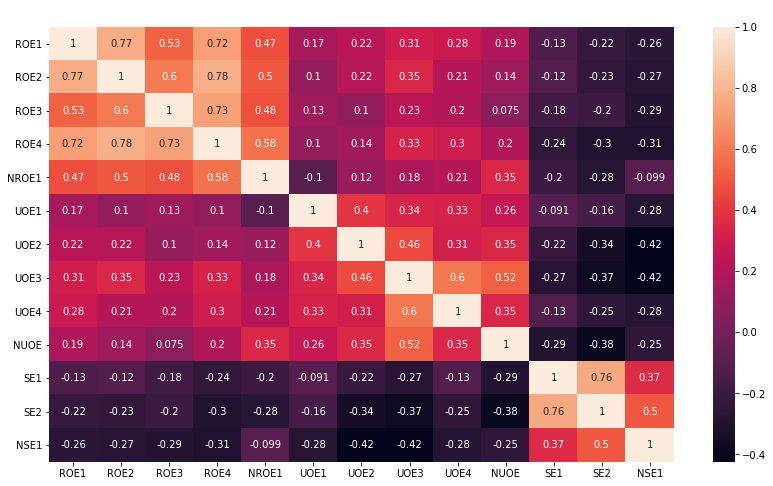

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          data_emotional_reversed.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

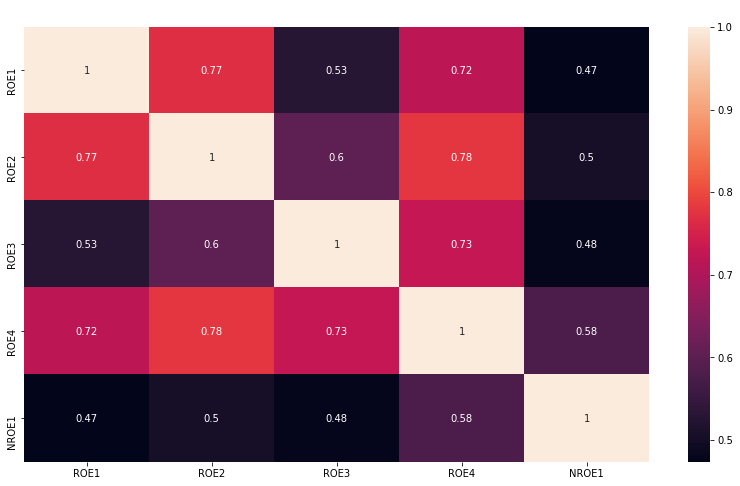

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          dataset_emotional_reversed_roe.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

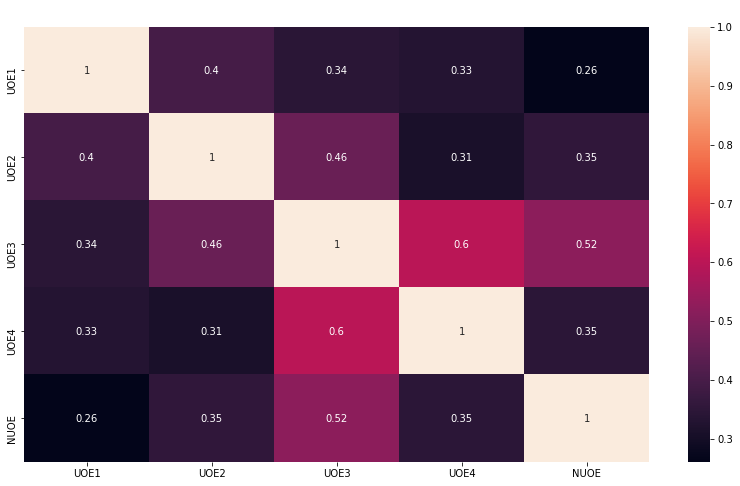

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          dataset_emotional_reversed_uoe.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

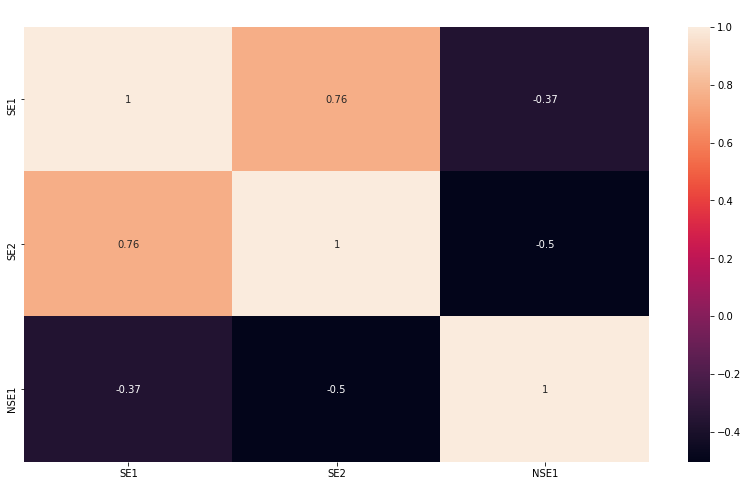

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          dataset_emotional_se.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

Cek konsistensi jawaban

In [ ]:
dataset_emotional_konsisten

,time,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas,ROE1,ROE2,ROE3,ROE4,NROE1,UOE1,UOE2,UOE3,UOE4,NUOE,SE1,SE2,NSE1,NAI1,NAI2,NAI3,NAI4,NAI5,NNAI1,LC1,LC2,LC3,LC4,LC5,LC6,NLC1,SD1,SD2,NSD1,CA1,CA2,CA3,NCA1,CP1,CP2,CP3,NCP1,CA1.1,CA2.1,CA3.1,NCA1.1
0,2020/04/13 7:17:50 PM GMT+7,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,5,4,5,5,4,4,4,4,1,2,2,2,2,4,2,2,2,3,2,2,2,2,4,4,2,2,2,2,4,4,4,4,4,4,4,4,2,2,2,3
1,2020/04/13 7:20:50 PM GMT+7,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,4,4,2,2,2,4,4,4,3,2,4,4,4,4,4,4,4,4,2,2,2,2,2,2,2,2,4,2,4,2,2,2,2
2,2020/04/14 6:06:56 PM GMT+7,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,1,1,1,1,1,4,3,2,4,2,5,5,3,5,5,5,5,5,5,5,5,5,5,5,5,5,1,1,2,5,5,5,5,5,5,5,5,1,1,1,1
3,2020/04/14 6:11:44 PM GMT+7,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,4,4,2,2,3,4,4,4,4,4,4,4,4,4,4,4,4,2,4,4,3,4,4,4,4,4,4,4,4,4,4,4,2
4,2020/04/14 6:12:11 PM GMT+7,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,3,3,2,3,3,3,3,3,4,4,3,3,4,2,2,2,2,3,4,4,4,3,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,2020/05/26 9:30:00 AM GMT+7,1,FAKULTAS VOKASI (VOCATIONS),1,1,1,3 - 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,5,5,4,4,5,4,3,4,5,4,2,2,2,4,4,5,4,3,5,4,5,4,2,2,4,4,2,4,2,5,5,5,5,5,5,5,5,5,5,5,5
166,2020/05/26 7:05:22 PM GMT+7,0,FAKULTAS TEKNOLOGI INDUSTRI DAN REKAYASA SISTE...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,5,5,5,5,5,5,5,5,5,5,1,1,1,5,5,5,3,4,4,5,5,5,5,5,5,5,3,3,3,5,5,5,5,5,5,5,5,3,3,4,4
167,2020/05/26 7:06:17 PM GMT+7,1,FAKULTAS DESAIN KREATIF DAN BISNIS DIGITAL (CR...,0,1,1,3 - 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,2,2,2,2,2,5,3,4,4,2,2,3,2,4,4,4,4,4,5,4,5,3,5,4,4,4,1,1,1,5,4,3,4,5,5,5,5,4,3,4,4
168,2020/05/26 7:07:47 PM GMT+7,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),0,1,1,> 5 Jam,> 5 Tahun,komunikasi (social media dll);Bermain Game,1,1,1,1,4,4,4,4,4,4,3,5,5,4,1,1,1,3,3,3,3,4,4,3,3,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4


In [ ]:
# dataset_emotional_konsisten = dataset_encode_reversed.copy()
dataset_emotional_konsisten = data_emotional_reversed.copy()
# dataset_emotional_konsisten = dataset_emotional_konsisten.loc[abs(dataset_emotional_konsisten['ROE1'] - dataset_emotional_konsisten['NROE1']) < 2]
# dataset_emotional_konsisten = dataset_emotional_konsisten.loc[
#                                 ( 
#                                     (dataset_emotional_konsisten['ROE1'] == dataset_emotional_konsisten['NROE1']) | ( (dataset_emotional_konsisten['ROE1'] != 3 | (dataset_emotional_konsisten['NROE1'] != 3) ) & (abs(dataset_emotional_konsisten['ROE1'] - dataset_emotional_konsisten['NROE1']) < 2) )
#                                 )
#                                  & (
#                                      (dataset_emotional_konsisten['UOE1'] == dataset_emotional_konsisten['NUOE']) | ( (dataset_emotional_konsisten['UOE1'] != 3 | (dataset_emotional_konsisten['NUOE'] != 3) ) & (abs(dataset_emotional_konsisten['UOE1'] - dataset_emotional_konsisten['NUOE']) < 2) )
#                                     )
#                                  & (
#                                      (dataset_emotional_konsisten['SE1'] == dataset_emotional_konsisten['NSE1']) | ( (dataset_emotional_konsisten['SE1'] != 3 | (dataset_emotional_konsisten['NSE1'] != 3) ) & (abs(dataset_emotional_konsisten['SE1'] - dataset_emotional_konsisten['NSE1']) < 2) )
#                                     )
#                               ]

dataset_emotional_konsisten = dataset_emotional_konsisten.loc[
                                ( 
                                    (dataset_emotional_konsisten['ROE1'] == dataset_emotional_konsisten['NROE1']) | (abs(dataset_emotional_konsisten['ROE1'] - dataset_emotional_konsisten['NROE1']) < 2)
                                )
                                 & (
                                     (dataset_emotional_konsisten['UOE1'] == dataset_emotional_konsisten['NUOE']) | (abs(dataset_emotional_konsisten['UOE1'] - dataset_emotional_konsisten['NUOE']) < 2)
                                    )
                                 & (
                                     (dataset_emotional_konsisten['SE1'] == dataset_emotional_konsisten['NSE1']) | (abs(dataset_emotional_konsisten['SE1'] - dataset_emotional_konsisten['NSE1']) < 2)
                                    )
                              ]
# dataset_emotional_konsisten = dataset_emotional_konsisten.reset_index(drop = True)
dataset_emotional_konsisten

,time,ROE1,ROE2,ROE3,ROE4,NROE1,UOE1,UOE2,UOE3,UOE4,NUOE,SE1,SE2,NSE1
1,2020/04/13 7:20:50 PM GMT+7,4,4,4,4,4,4,4,4,4,4,2,2,2
3,2020/04/14 6:11:44 PM GMT+7,4,4,4,4,4,4,4,4,4,4,2,2,3
4,2020/04/14 6:12:11 PM GMT+7,3,3,2,3,3,3,3,3,4,4,3,3,4
5,2020/04/14 6:16:36 PM GMT+7,4,5,3,4,4,4,4,4,5,4,3,2,3
6,2020/04/14 6:17:14 PM GMT+7,4,5,4,5,4,4,3,2,3,3,3,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164,2020/05/20 2:42:30 AM GMT+7,3,3,3,3,3,4,4,5,4,5,2,3,3
165,2020/05/26 9:30:00 AM GMT+7,5,5,4,4,5,4,3,4,5,4,2,2,2
166,2020/05/26 7:05:22 PM GMT+7,5,5,5,5,5,5,5,5,5,5,1,1,1
168,2020/05/26 7:07:47 PM GMT+7,4,4,4,4,4,4,3,5,5,4,1,1,1




---





# # Exploratory Data Analysis - Nomophobia Variable



> Nomophobia

Pembelajar menyontek bisa saja dipengaruhi oleh sebuah
phobia atau takut jika tidak berada dekat dengan perangkat
mobile phone


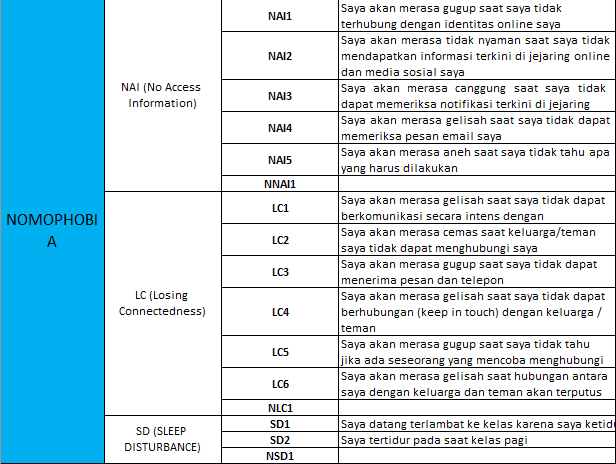

In [ ]:
data_nomophobia_with_identity = pd.concat([respond_identity, respond_nomophobia], axis=1)
nomophobia_reversed = dataset_reversed[dataset_nomophobia.columns]
# data_nomophobia_reversed = pd.concat((dataset_reversed[['time']], nomophobia_reversed), axis = 1)

# mengandung data identitas yang telah ter encode
# data_nomophobia_reversed_with_identity = pd.concat((respond_identity_encode, data_nomophobia_reversed), axis = 1)
data_nomophobia_reversed_with_identity = pd.concat((respond_identity_encode, nomophobia_reversed), axis = 1)
data_nomophobia_reversed_with_identity.head()

,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas,NAI1,NAI2,NAI3,NAI4,NAI5,NNAI1,LC1,LC2,LC3,LC4,LC5,LC6,NLC1,SD1,SD2,NSD1
0,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,2,4,2,2,2,3,2,2,2,2,4,4,2,2,2,2
1,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,3,2,4,4,4,4,4,4,4,4,2,2,2
2,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,5,5,5,5,5,5,5,5,5,5,5,5,5,1,1,2
3,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,4,4,4,4,2,4,4,3
4,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,2,2,2,2,3,4,4,4,3,4,3,4,4,4,4,4


In [ ]:
dataset_nomophobia_nai = data_nomophobia_with_identity[['NAI1','NAI2','NAI3','NAI4', 'NAI5', 'NNAI1']]
dataset_nomophobia_lc = data_nomophobia_with_identity[['LC1','LC2','LC3','LC4', 'LC5', 'LC6', 'NLC1']]
dataset_nomophobia_sd = data_nomophobia_with_identity[['SD1','SD2', 'NSD1']]
dataset_nomophobia_nai_with_identity = pd.concat([respond_identity_encode, dataset_nomophobia_nai], axis=1)
dataset_nomophobia_lc_with_identity = pd.concat([respond_identity_encode, dataset_nomophobia_lc], axis=1)
dataset_nomophobia_sd_with_identity = pd.concat([respond_identity_encode, dataset_nomophobia_sd], axis=1)

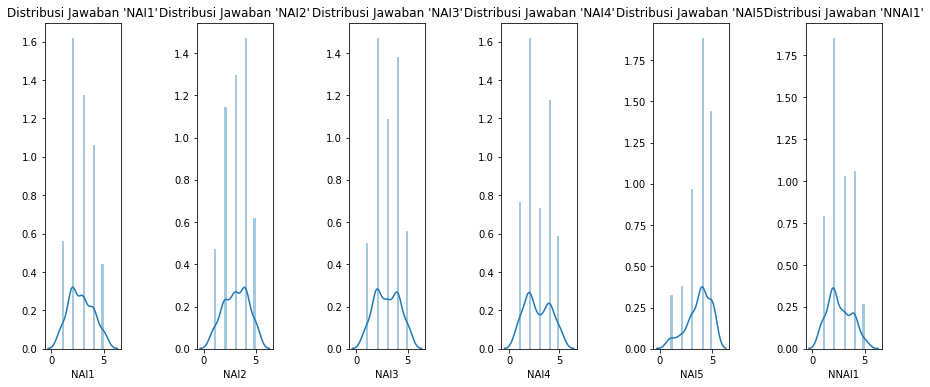

In [ ]:
show_distribution_plot(dataset_nomophobia_nai)

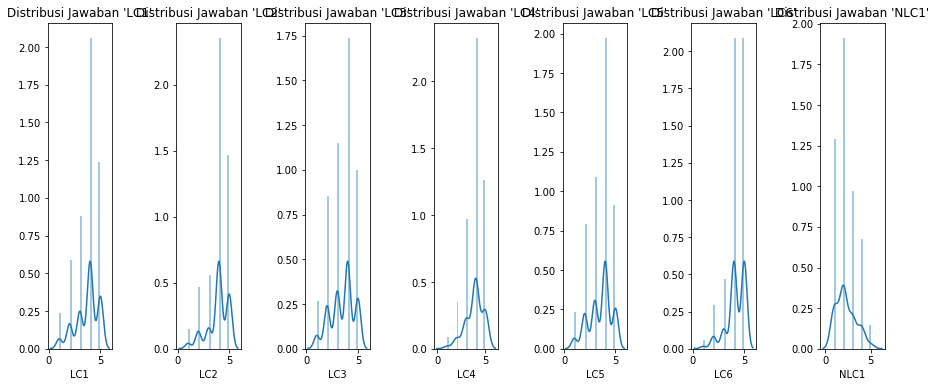

In [ ]:
show_distribution_plot(dataset_nomophobia_lc)

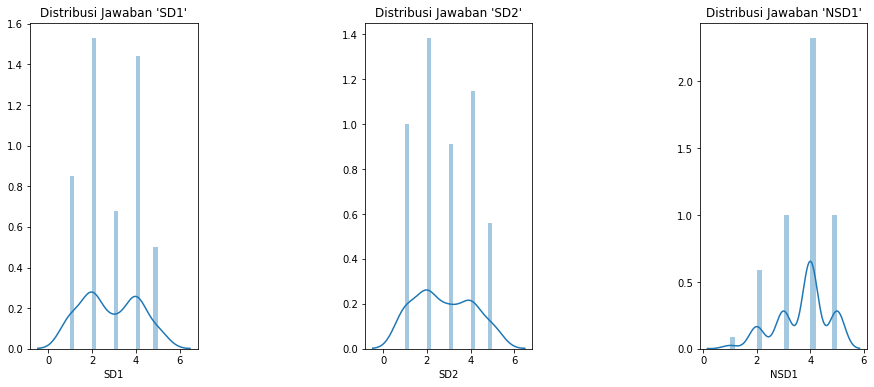

In [ ]:
show_distribution_plot(dataset_nomophobia_sd)

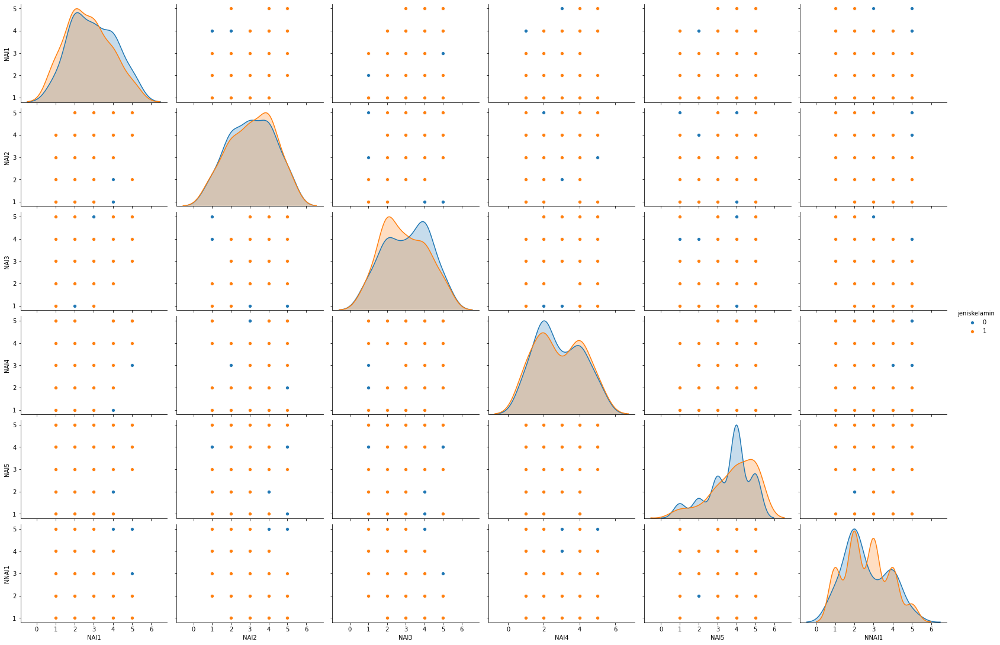

In [ ]:
# Let's see our data in a detailed way with pairplot
nai_jeniskelamin = dataset_nomophobia_nai_with_identity.drop(['asalfakultas', 'Angkatan', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(nai_jeniskelamin, hue='jeniskelamin', aspect=1.5)
plt.show()

In [ ]:
# Let's see our data in a detailed way with pairplot
roe_asalfakultas = dataset_emotional_roe_with_identity.drop(['jeniskelamin', 'Angkatan', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(roe_asalfakultas, hue='asalfakultas', aspect=1.5)
plt.show()

In [ ]:
# Let's see our data in a detailed way with pairplot
roe_angkatan = dataset_emotional_roe_with_identity.drop(['jeniskelamin', 'asalfakultas', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(roe_angkatan, hue='Angkatan', aspect=1.5)
plt.show()

In [ ]:
# Let's see our data in a detailed way with pairplot
se_jeniskelamin = dataset_emotional_se_with_identity.drop(['asalfakultas', 'Angkatan',
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(se_jeniskelamin, hue='jeniskelamin', aspect=1.5)
plt.show()

In [ ]:
# Let's see our data in a detailed way with pairplot
uoe_jeniskelamin = dataset_emotional_uoe_with_identity.drop(['asalfakultas', 'Angkatan', 'asalfakultas', 
             'apakah_masihmenggunakan', 'membantu_produktivitas', 'intensitas_penggunaan',
             'durasi_penggunaan', 'kebutuhan_penggunaan', 'apakah_pernah_mencariinfo',
             'apakah_pernah_membuatcatatan','apakah_pernah_fotopunyateman', 'apakah_pernah_kirimfototugas'], axis=1)

sns.pairplot(uoe_jeniskelamin, hue='jeniskelamin', aspect=1.5)
plt.show()

In [ ]:
dataset_nomophobia_reversed_nai = dataset_reversed[['NAI1','NAI2','NAI3','NAI4', 'NAI5', 'NNAI1']]
dataset_nomophobia_reversed_lc = dataset_reversed[['LC1','LC2','LC3','LC4', 'LC5', 'LC6', 'NLC1']]
dataset_nomophobia_reversed_sd = dataset_reversed[['SD1','SD2', 'NSD1']]
dataset_nomophobia_reversed_nai_with_identity = pd.concat([respond_identity_encode, dataset_nomophobia_reversed_nai], axis=1)
dataset_nomophobia_uoe_with_identity = pd.concat([respond_identity_encode, dataset_nomophobia_reversed_lc], axis=1)
dataset_nomophobia_se_with_identity = pd.concat([respond_identity_encode, dataset_nomophobia_reversed_sd], axis=1)

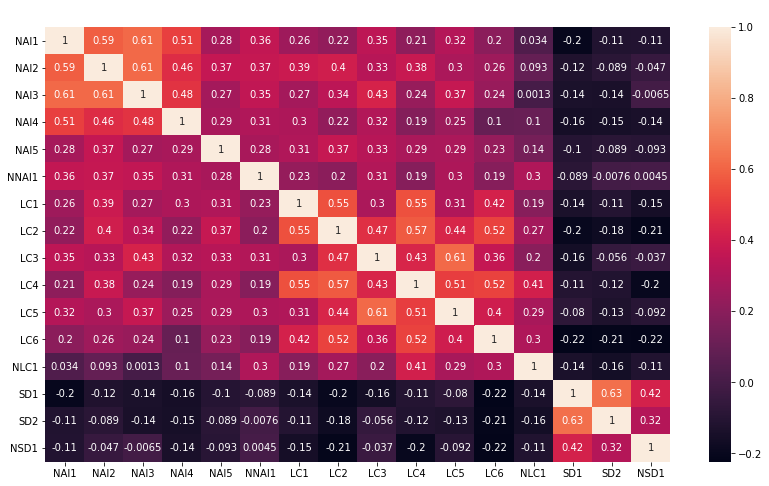

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          data_nomophobia_reversed.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

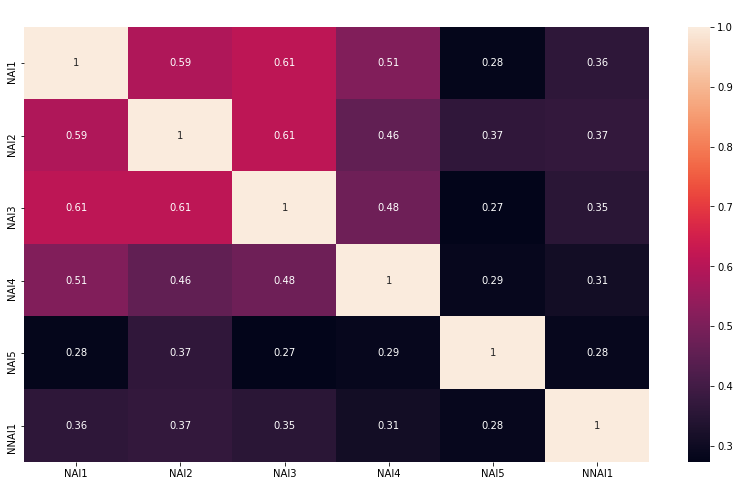

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          dataset_nomophobia_reversed_nai.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

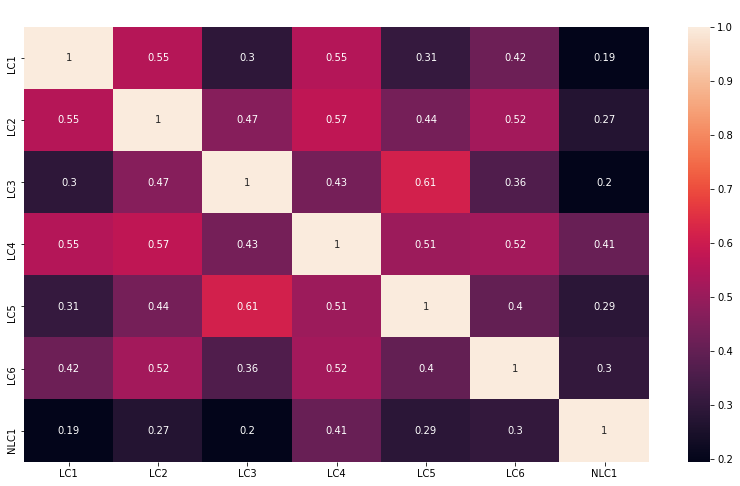

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          dataset_nomophobia_reversed_lc.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

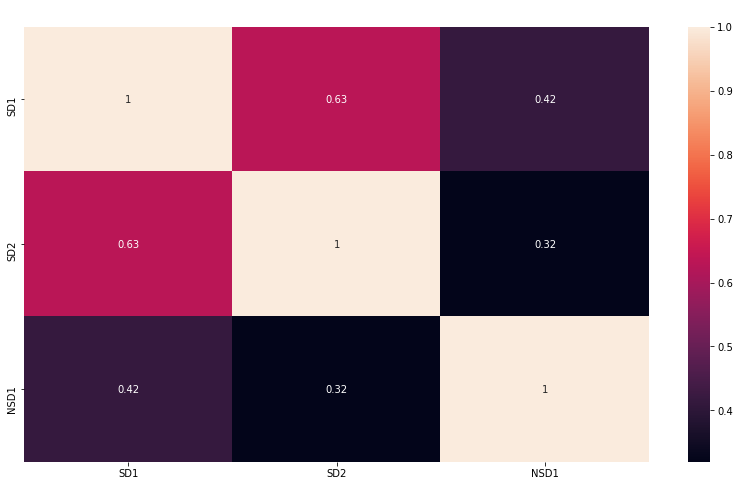

In [ ]:
plt.figure(figsize = (14,8))
title_obj = plt.title('Korelasi Tiap Feature', size = 18)
plt.setp(title_obj, color='white')

# Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(sahamASII_corr, dtype=np.bool))

sns.heatmap(
          dataset_nomophobia_reversed_sd.corr(),
          # mask = mask,
          annot = True
        )

plt.show()

Cek konsistensi jawaban

In [ ]:
# dataset_nomophobia_konsisten = dataset_encode_reversed.copy()
dataset_nomophobia_konsisten = data_nomophobia_reversed.copy()
# dataset_nomophobia_konsisten = dataset_nomophobia_konsisten.loc[
#                                 ( 
#                                     (dataset_nomophobia_konsisten['NAI1'] == dataset_nomophobia_konsisten['NNAI1']) | ( (dataset_nomophobia_konsisten['NAI1'] != 3 | (dataset_nomophobia_konsisten['NNAI1'] != 3) ) & (abs(dataset_nomophobia_konsisten['NAI1'] - dataset_nomophobia_konsisten['NNAI1']) < 2) )
#                                 )
#                                  & (
#                                      (dataset_nomophobia_konsisten['LC1'] == dataset_nomophobia_konsisten['NLC1']) | ( (dataset_nomophobia_konsisten['LC1'] != 3 | (dataset_nomophobia_konsisten['NLC1'] != 3) ) & (abs(dataset_nomophobia_konsisten['LC1'] - dataset_nomophobia_konsisten['NLC1']) < 2) )
#                                     )
#                                  & (
#                                      (dataset_nomophobia_konsisten['SD1'] == dataset_nomophobia_konsisten['NSD1']) | ( (dataset_nomophobia_konsisten['SD1'] != 3 | (dataset_nomophobia_konsisten['NSD1'] != 3) ) & (abs(dataset_nomophobia_konsisten['SD1'] - dataset_nomophobia_konsisten['NSD1']) < 2) )
#                                     )
#                               ]

dataset_nomophobia_konsisten = dataset_nomophobia_konsisten.loc[
                                ( 
                                    (dataset_nomophobia_konsisten['NAI1'] == dataset_nomophobia_konsisten['NNAI1']) | (abs(dataset_nomophobia_konsisten['NAI1'] - dataset_nomophobia_konsisten['NNAI1']) < 2)
                                )
                                 & (
                                     (dataset_nomophobia_konsisten['LC1'] == dataset_nomophobia_konsisten['NLC1']) | (abs(dataset_nomophobia_konsisten['LC1'] - dataset_nomophobia_konsisten['NLC1']) < 2)
                                    )
                                 & (
                                     (dataset_nomophobia_konsisten['SD1'] == dataset_nomophobia_konsisten['NSD1']) | (abs(dataset_nomophobia_konsisten['SD1'] - dataset_nomophobia_konsisten['NSD1']) < 2)
                                    )
                              ]
# dataset_nomophobia_konsisten = dataset_nomophobia_konsisten.loc[((dataset_nomophobia_konsisten['NAI1'] == dataset_nomophobia_konsisten['NNAI1']) | (abs(dataset_nomophobia_konsisten['NAI1'] - dataset_nomophobia_konsisten['NNAI1']) < 2)) &
#                                                 ((dataset_nomophobia_konsisten['LC1'] == dataset_nomophobia_konsisten['NLC1']) | (abs(dataset_nomophobia_konsisten['LC1'] - dataset_nomophobia_konsisten['NLC1']) < 2)) & 
#                                                 ((dataset_nomophobia_konsisten['SD1'] == dataset_nomophobia_konsisten['NSD1']) | (abs(dataset_nomophobia_konsisten['SD1'] - dataset_nomophobia_konsisten['NSD1']) < 2))]
# dataset_nomophobia_konsisten = dataset_nomophobia_konsisten.reset_index(drop= True)
dataset_nomophobia_konsisten

,time,NAI1,NAI2,NAI3,NAI4,NAI5,NNAI1,LC1,LC2,LC3,LC4,LC5,LC6,NLC1,SD1,SD2,NSD1
0,2020/04/13 7:17:50 PM GMT+7,2,4,2,2,2,3,2,2,2,2,4,4,2,2,2,2
1,2020/04/13 7:20:50 PM GMT+7,4,4,4,3,2,4,4,4,4,4,4,4,4,2,2,2
2,2020/04/14 6:06:56 PM GMT+7,5,5,5,5,5,5,5,5,5,5,5,5,5,1,1,2
6,2020/04/14 6:17:14 PM GMT+7,2,2,2,2,4,2,2,2,2,2,1,2,2,4,5,4
11,2020/04/17 7:44:41 PM GMT+7,5,5,5,4,5,5,5,5,5,4,5,5,5,4,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,2020/05/26 9:30:00 AM GMT+7,4,4,5,4,3,5,4,5,4,2,2,4,4,2,4,2
166,2020/05/26 7:05:22 PM GMT+7,5,5,5,3,4,4,5,5,5,5,5,5,5,3,3,3
167,2020/05/26 7:06:17 PM GMT+7,4,4,4,4,4,5,4,5,3,5,4,4,4,1,1,1
168,2020/05/26 7:07:47 PM GMT+7,3,3,3,3,4,4,3,3,4,3,4,4,4,4,4,4




---





# Exploratory Data Analysis - Academic Cheating Variable



> Academic Cheating

Variable atau faktor inilah yang akan menentukan variabel atau faktor lainnya Dari faktor-faktor tersebut, maka muncul 4 hipotesis berikut: 



1.   H1: Emotional intelligence relates directly and positively to academic iCheating; 
2.   H2: Emotional intelligence is negatively related to nomophobia;  emotional intelligence and academic iCheating is mediated by nomophobia;
3.   H3: Nomophobia is positively related to academic iCheating
4.   H4: The negative relationship between



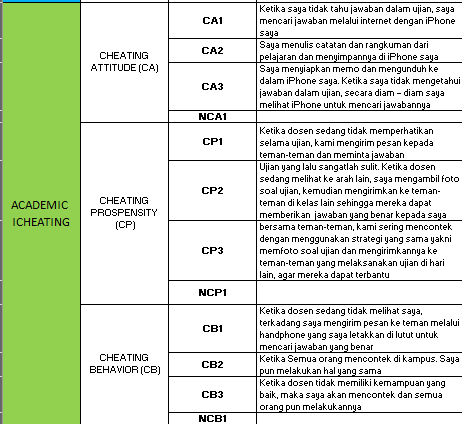

In [ ]:
cb_reversed = dataset_reversed[dataset_cb.columns]

# mengandung data identitas yang telah ter encode
data_cb_reversed_with_identity = pd.concat((respond_identity_encode, cb_reversed), axis = 1)
data_cb_reversed_with_identity

,jeniskelamin,asalfakultas,Angkatan,apakah_masihmenggunakan,membantu_produktivitas,intensitas_penggunaan,durasi_penggunaan,kebutuhan_penggunaan,apakah_pernah_mencariinfo,apakah_pernah_membuatcatatan,apakah_pernah_fotopunyateman,apakah_pernah_kirimfototugas,CA1,CA2,CA3,NCA1,CP1,CP2,CP3,NCP1,CA1.1,CA2.1,CA3.1,NCA1.1
0,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,2,2,2,3
1,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,2,2,2,2,2,4,2,4,2,2,2,2
2,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,3 - 5 Jam,< 1 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,5,5,5,5,5,5,5,5,1,1,1,1
3,0,FAKULTAS TEKNOLOGI ELEKTRO DAN INFORMATIKA CER...,2,1,1,> 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,4,4,4,4,4,4,4,4,4,4,4,2
4,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,4,4,4,4,4,4,4,4,4,4,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,1,FAKULTAS VOKASI (VOCATIONS),1,1,1,3 - 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,5,5,5,5,5,5,5,5,5,5,5,5
166,0,FAKULTAS TEKNOLOGI INDUSTRI DAN REKAYASA SISTE...,2,1,1,3 - 5 Jam,1 - 3 Tahun,komunikasi (social media dll);Bermain Game;Men...,1,1,1,1,5,5,5,5,5,5,5,5,3,3,4,4
167,1,FAKULTAS DESAIN KREATIF DAN BISNIS DIGITAL (CR...,0,1,1,3 - 5 Jam,3 - 5 Tahun,komunikasi (social media dll);Mengambil Foto,1,1,1,1,5,4,3,4,5,5,5,5,4,3,4,4
168,0,FAKULTAS TEKNOLOGI KELAUTAN (MARTECH),0,1,1,> 5 Jam,> 5 Tahun,komunikasi (social media dll);Bermain Game,1,1,1,1,4,4,4,4,4,4,4,4,4,4,4,4


In [ ]:
dataset_cb_ca = data_cb_reversed_with_identity[['CA1','CA2','CA3','NCA1']]
dataset_cb_cp = data_cb_reversed_with_identity[['CP1','CP2','CP3','NCP1']]
dataset_cb_ca1 = data_cb_reversed_with_identity[['CA1.1','CA2.1', 'NCA1.1']]
dataset_cb_cp_with_identity = pd.concat([respond_identity_encode, dataset_cb_ca], axis=1)
dataset_cb_cp_with_identity = pd.concat([respond_identity_encode, dataset_cb_cp], axis=1)
dataset_cb_ca1_with_identity = pd.concat([respond_identity_encode, dataset_cb_ca1], axis=1)

Cek konsistensi jawaban

In [ ]:
dataset_cb_konsisten = data_cb_reversed.copy()
# dataset_cb_konsisten = dataset_cb_konsisten.loc[
#                                 ( 
#                                     (dataset_cb_konsisten['CA1'] == dataset_cb_konsisten['NCA1']) | ( (dataset_cb_konsisten['CA1'] != 3 | (dataset_cb_konsisten['NCA1'] != 3) ) & (abs(dataset_cb_konsisten['CA1'] - dataset_cb_konsisten['NCA1']) < 2) )
#                                 )
#                                  & (
#                                      (dataset_cb_konsisten['CP1'] == dataset_cb_konsisten['NCP1']) | ( (dataset_cb_konsisten['CP1'] != 3 | (dataset_cb_konsisten['NCP1'] != 3) ) & (abs(dataset_cb_konsisten['CP1'] - dataset_cb_konsisten['NCP1']) < 2) )
#                                     )
#                                  & (
#                                      (dataset_cb_konsisten['CA1.1'] == dataset_cb_konsisten['NCA1.1']) | ( (dataset_cb_konsisten['CA1.1'] != 3 | (dataset_cb_konsisten['NCA1.1'] != 3) ) & (abs(dataset_cb_konsisten['CA1.1'] - dataset_cb_konsisten['NCA1.1']) < 2) )
#                                     )
#                               ]

dataset_cb_konsisten = dataset_cb_konsisten.loc[
                                ( 
                                    (dataset_cb_konsisten['CA1'] == dataset_cb_konsisten['NCA1']) | (abs(dataset_cb_konsisten['CA1'] - dataset_cb_konsisten['NCA1']) < 2)
                                )
                                 & (
                                     (dataset_cb_konsisten['CP1'] == dataset_cb_konsisten['NCP1']) | (abs(dataset_cb_konsisten['CP1'] - dataset_cb_konsisten['NCP1']) < 2)
                                    )
                                 & (
                                     (dataset_cb_konsisten['CA1.1'] == dataset_cb_konsisten['NCA1.1']) | (abs(dataset_cb_konsisten['CA1.1'] - dataset_cb_konsisten['NCA1.1']) < 2)
                                    )
                              ]
dataset_cb_konsisten

,time,CA1,CA2,CA3,NCA1,CP1,CP2,CP3,NCP1,CA1.1,CA2.1,CA3.1,NCA1.1
0,2020/04/13 7:17:50 PM GMT+7,4,4,4,4,4,4,4,4,2,2,2,3
2,2020/04/14 6:06:56 PM GMT+7,5,5,5,5,5,5,5,5,1,1,1,1
4,2020/04/14 6:12:11 PM GMT+7,4,4,4,4,4,4,4,4,4,4,4,5
5,2020/04/14 6:16:36 PM GMT+7,5,5,5,4,4,3,3,3,5,5,5,4
6,2020/04/14 6:17:14 PM GMT+7,5,4,5,4,4,4,4,4,4,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,2020/05/26 9:30:00 AM GMT+7,5,5,5,5,5,5,5,5,5,5,5,5
166,2020/05/26 7:05:22 PM GMT+7,5,5,5,5,5,5,5,5,3,3,4,4
167,2020/05/26 7:06:17 PM GMT+7,5,4,3,4,5,5,5,5,4,3,4,4
168,2020/05/26 7:07:47 PM GMT+7,4,4,4,4,4,4,4,4,4,4,4,4


# Exploratory Data Analysis - Descriptive Question

In [ ]:
# change column name to easier analysis
dataset_descriptive.columns = ['alasan_memilih','tips_tidak_kecanduan_smartphone','motivasi_curang', 'tips_tidak_curang', 'langkah_dosen_mencegah_curang', 'tips_mengatur_emosi']
dataset_descriptive.head()

,alasan_memilih,tips_tidak_kecanduan_smartphone,motivasi_curang,tips_tidak_curang,langkah_dosen_mencegah_curang,tips_mengatur_emosi
0,ui dan ux nya simpel bagus,lebih sering berinteraksi sosial secara nyata,tidak belajar saat ujian,no system is safe,no system is safe,"belajar terlalu lama membuat jenuh mahasiswa, ..."
1,Karena lebih simple,Menggunakan ponsel seperlunya,Kepepet karena tidak belajar,Belajar dengan cukup sehingga bisa menguasai m...,Memberi hukuman seberat-beratnya. Karena kejuj...,Memanfaatkan proses belajar itu sebaik-baiknya...
2,Gengsi,Mengatur waktu sendiri,Agar mendapatkan nilai memuaskan,Antara materi yang diberikan dosen dengan yang...,Meningkatkan kualitas ajar mengajar,Jangan membosankan. Ajar sesuai yang akan diuj...
3,lebih simple,menjaga jarak,dapet bilai bagus,gatau,gatau,gatau
4,lebih compatible buat kepentingan sehari hari,mencari kesibukan lain yang lebih bermanfaat,demi lulus matkul tersebut,sadar diri,mengumpulkan smartphone mahasiswa/i sebelum uj...,ingat tujuan awal


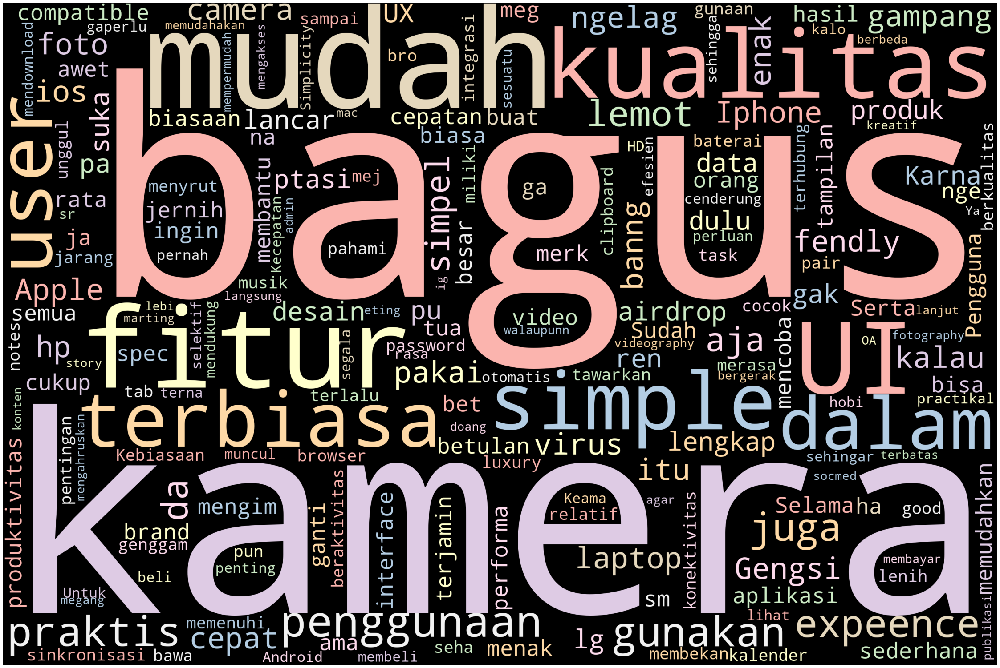

In [ ]:
# clean text
text_data_reason_choose_iphone = re.sub(r'==.*?==+', '', str(dataset_descriptive[['alasan_memilih']].values))
words_to_replaced = ['dengan', 'yang', 'melakukan', 'nan', 'menggunakan', 'yang', 'lebih', 'di', 'nya', 'diri', 'untuk',
                     'dan', 'lain', 'tidak', 'Melakukan', 'sering', 'atau', 'soalnya', 'hal', 'atau', 'mencari','menyibukkan'
                     'smartphone', 'Menggunakan', 'Mengatur', 'Cari', 'secara', 'banyak', 'membuat', 'orang'
                     'dalam', 'sih', 'Jangan', 'pemakaian', 'ada', 'Cara', 'smartphone', '\'', 'ri', 'lakukan',
                     'bak', 'misal', 'saya', 'yg', 'Memper', 'seperti', 'kita', 'Karena', 'iphone', 'iPhone', ' iPhone'
                     'karena', 'sangat', 'baik', 'Lebih', 'sudah', 'device', 'iklan', 'memiliki', 'menurut' ,'kalau'
                     'gunakan', 'man', 'android', 'pindah', 'butuh' ,'Saya', 'Udah', 'Tidak', 'ke', 'banngkan',
                     'mesti', ' karena', 'karena ']
text_data_reason_choose_iphone = replace_string(text_data_reason_choose_iphone, words_to_replaced)

# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text_data_reason_choose_iphone)
# Plot
plot_cloud(wordcloud)



> Most words on "alasan memilih iPhone"



*   Bagus
*   Kamera
*   Mudah







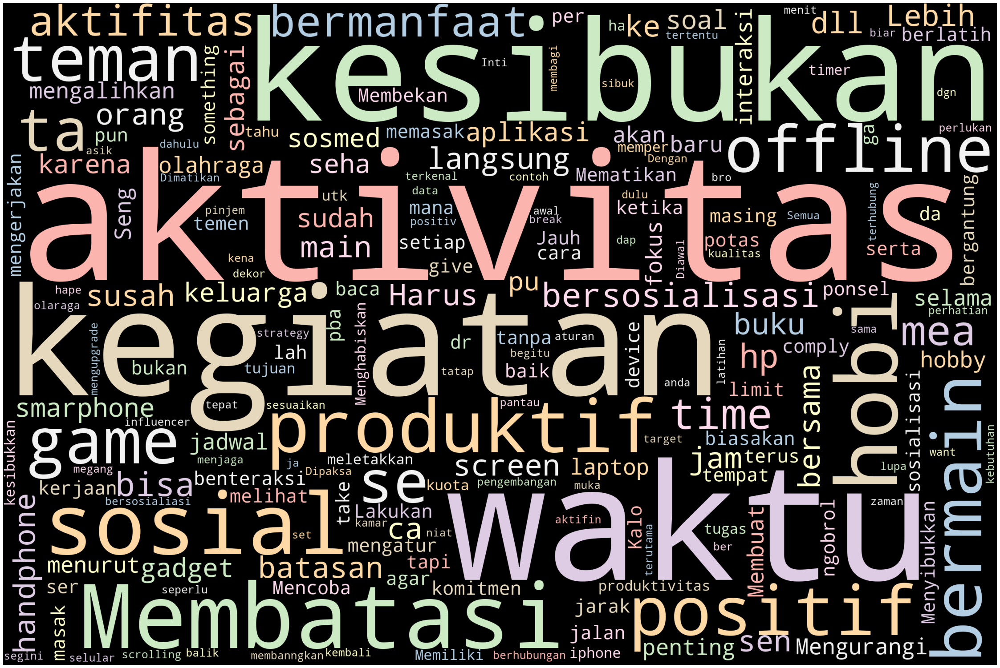

In [ ]:
# clean text
text_tips_tidakkecanduan = re.sub(r'==.*?==+', '', str(dataset_descriptive[['tips_tidak_kecanduan_smartphone']].values))
words_to_replaced = ['dengan', 'yang', 'melakukan', 'nan', 'menggunakan', 'yang', 'lebih', 'di', 'nya', 'diri', 'untuk',
                     'dan', 'lain', 'tidak', 'Melakukan', 'sering', 'atau', 'soalnya', 'hal', 'atau', 'mencari','menyibukkan',
                     'smartphone', 'Menggunakan', 'Mengatur', 'Cari', 'secara', 'banyak', 'membuat', 'semua', 'dalam',
                     'dalam', 'sih', 'Jangan', 'pemakaian', 'ada', 'Cara', 'smartphone', '\'', 'ri', 'lakukan', 'Menca',
                     'bak', 'misal', 'saya', 'yg', 'Memper', 'seperti', 'kita', 'kalo', 'penggunaan', 'kehidupan', 'terlalu']
text_tips_tidakkecanduan = replace_string(text_tips_tidakkecanduan, words_to_replaced)

# Generate word cloud
wordcloud_tips_tidakkecanduan = WordCloud(width = 3000, height = 2000, random_state=1, colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text_tips_tidakkecanduan)
# Plot
plot_cloud(wordcloud_tips_tidakkecanduan)



> Most words on "tips tidak kecanduan smartphone"



*   Aktivitas
*   Kesibukan
*   Membatasi





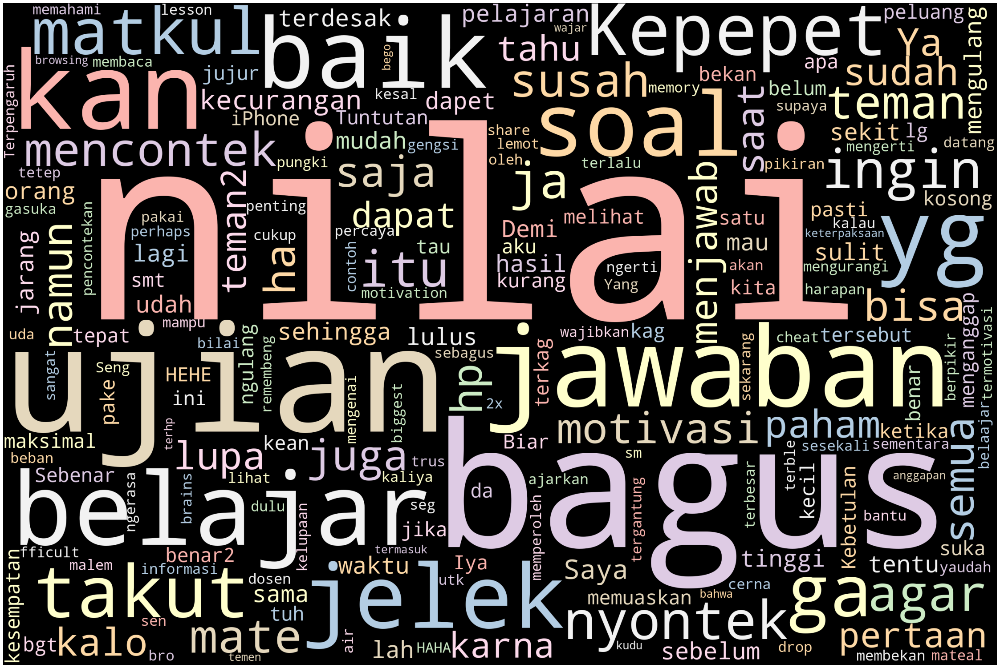

In [ ]:
# clean text
text_motivasicurang = re.sub(r'==.*?==+', '', str(dataset_descriptive[['motivasi_curang']].values))
words_to_replaced = ['dengan', 'yang', 'melakukan', 'nan', 'menggunakan', 'yang', 'lebih', 'di', 'nya', 'diri', 'untuk',
                     'dan', 'lain', 'tidak', 'Tidak', 'Melakukan', 'sering', 'atau', 'soalnya', 'hal', 'atau', 'mencari','menyibukkan'
                     'smartphone', 'Menggunakan', 'Mengatur', 'Cari', 'secara', 'banyak', 'membuat', 'Agar', 'mendapat',
                     'dalam', 'sih', 'Jangan', 'pemakaian', 'ada', 'Cara', 'smartphone', '\'', 'ri', 'lakukan',
                     'bak', 'misal', 'saya', 'karena', 'Karena', 'pernah', 'paling', 'mendapatkan', 'Mendapatkan',
                     'iphone', 'Ketika', 'Pernah']
text_motivasicurang = replace_string(text_motivasicurang, words_to_replaced)

# Generate word cloud
wordcloud_motivasi_curang = WordCloud(width = 3000, height = 2000, random_state=1, colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text_motivasicurang)
# Plot
plot_cloud(wordcloud_motivasi_curang)



> Most words on "motivasi untuk curang"


*   Nilai
*   Jawaban
*   Kepepet





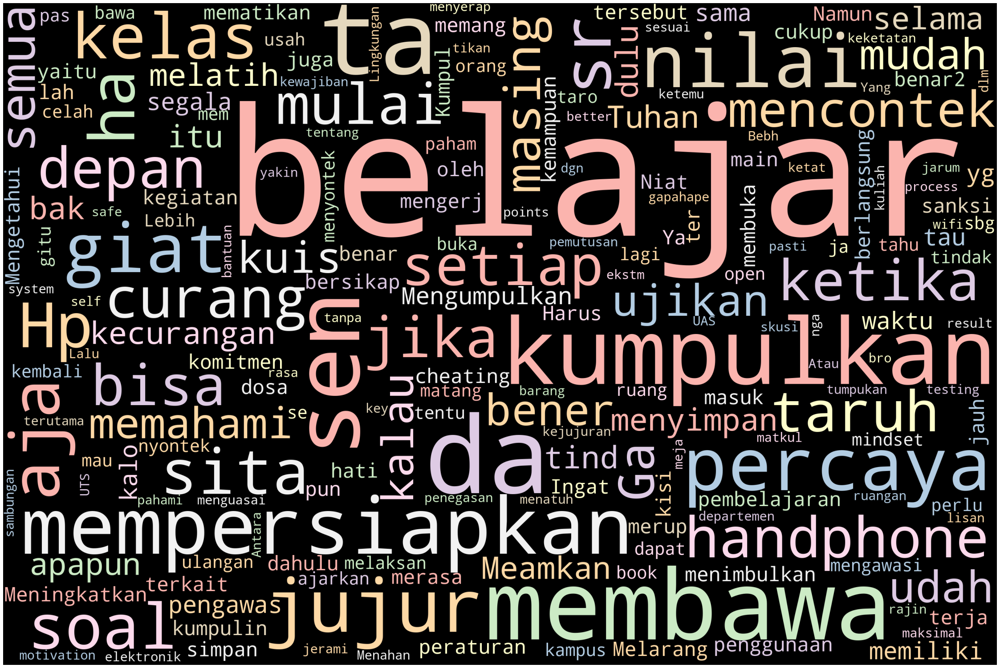

In [ ]:
# clean text
text_tips_tidak_curang = re.sub(r'==.*?==+', '', str(dataset_descriptive[['tips_tidak_curang']].values))
words_to_replaced = ['dengan', 'yang', 'melakukan', 'nan', 'menggunakan', 'yang', 'lebih', 'di', 'nya', 'diri', 'untuk',
                     'dan', 'lain', 'tidak', 'Tidak', 'Melakukan', 'sering', 'atau', 'soalnya', 'hal', 'atau', 'mencari','menyibukkan'
                     'smartphone', 'Menggunakan', 'Mengatur', 'Cari', 'secara', 'banyak', 'membuat', 'Agar', 'mendapat',
                     'dalam', 'sih', 'Jangan', 'pemakaian', 'ada', 'Cara', 'smartphone', '\'', 'ri', 'lakukan', 'setiap'
                     'bak', 'misal', 'saya', 'karena', 'Karena', 'pernah', 'paling', 'mendapatkan', 'Mendapatkan',
                     'iphone', 'Ketika', 'Pernah', 'ujian', 'hp', 'saat', 'baik', 'kita', 'sebelum', 'bahwa', 'harus',
                     'mate', 'mahasiswa', 'selalu', 'agar', 'dosen', 'kesran', 'biar', 'ke ', 'sehingga', 'bukan', 'bekan',
                     'cara', 'Saat ', 'berbuat', 'akan', 'Saya']
text_tips_tidak_curang = replace_string(text_tips_tidak_curang, words_to_replaced)

# Generate word cloud
wordcloud_tips_tidak_curang = WordCloud(width = 3000, height = 2000, random_state=1, colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text_tips_tidak_curang)
# Plot
plot_cloud(wordcloud_tips_tidak_curang)



> Most words on "tips tidak curang"


*   Belajar
*   mempersiapkan
*   jujur





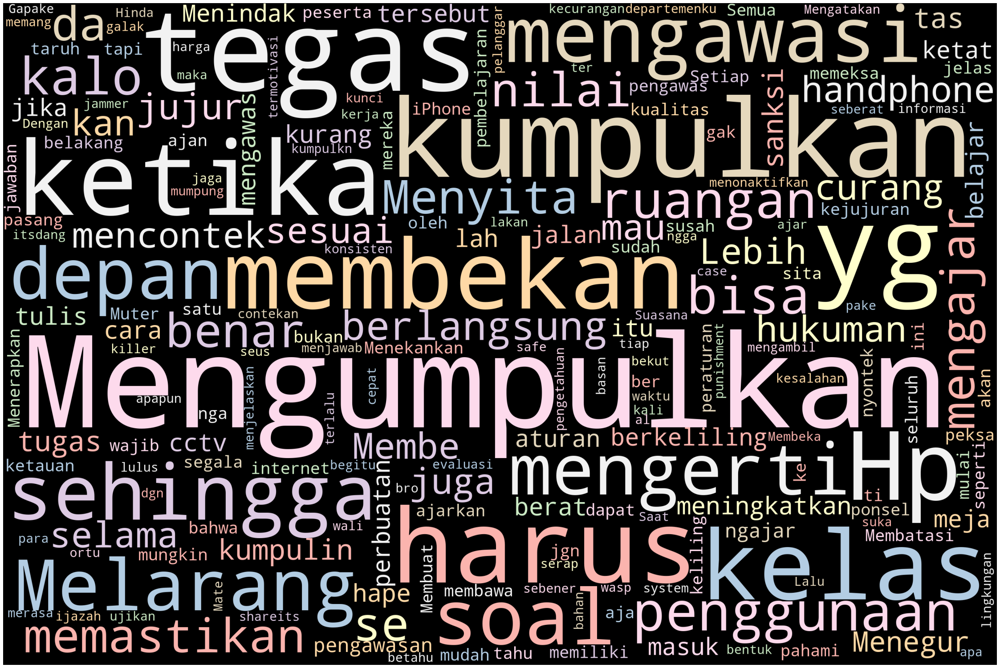

In [ ]:
# clean text
text_langkah_dosen_mencegah_curang = re.sub(r'==.*?==+', '', str(dataset_descriptive[['langkah_dosen_mencegah_curang']].values))
words_to_replaced = ['dengan', 'yang', 'melakukan', 'nan', 'menggunakan', 'yang', 'lebih', 'di', 'nya', 'diri', 'untuk',
                     'dan', 'lain', 'tidak', 'Tidak', 'Melakukan', 'sering', 'atau', 'soalnya', 'hal', 'atau', 'mencari','menyibukkan'
                     'smartphone', 'Menggunakan', 'Mengatur', 'Cari', 'secara', 'banyak', 'membuat', 'Agar', 'mendapat',
                     'dalam', 'sih', 'Jangan', 'pemakaian', 'ada', 'Cara', 'smartphone', '\'', 'ri', 'lakukan',
                     'bak', 'misal', 'saya', 'karena', 'Karena', 'pernah', 'paling', 'mendapatkan', 'Mendapatkan',
                     'iphone', 'Ketika', 'Pernah', 'ujian', 'hp', 'saat', 'baik', 'kita', 'sebelum',
                     'mate', 'mahasiswa', 'selalu', 'agar', 'dosen']
text_langkah_dosen_mencegah_curang = replace_string(text_langkah_dosen_mencegah_curang, words_to_replaced)

# Generate word cloud
wordcloud_text_langkah_dosen_mencegah_curang = WordCloud(width = 3000, height = 2000, random_state=1, colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text_langkah_dosen_mencegah_curang)
# Plot
plot_cloud(wordcloud_text_langkah_dosen_mencegah_curang)



> Most words on "tips bagi dosen/tendik untuk meminimalisir kegiatan curang"



*   Mengumpulkan/menyita Hp
*   Tegas
*   Mengawasi






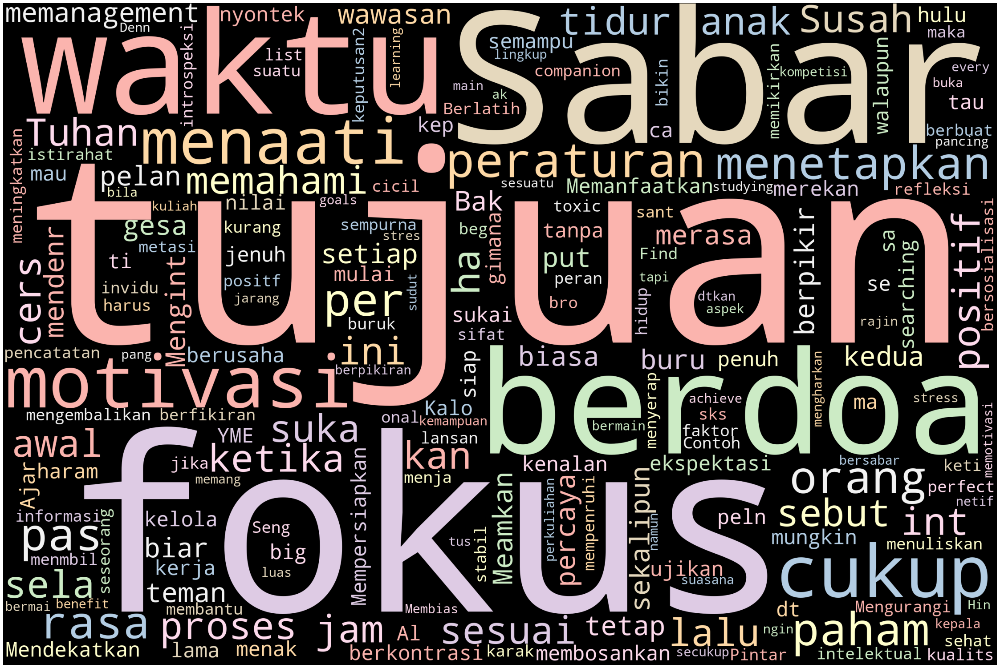

In [ ]:
# clean text
text_tips_mengatur_emosi = re.sub(r'==.*?==+', '', str(dataset_descriptive[['tips_mengatur_emosi']].values))
words_to_replaced = ['dengan', 'yang', 'melakukan', 'nan', 'menggunakan', 'yang', 'lebih', 'di', 'nya', 'diri', 'untuk',
                     'dan', 'lain', 'tidak', 'Tidak', 'Melakukan', 'sering', 'atau', 'soalnya', 'hal', 'atau', 'mencari','menyibukkan',
                     'smartphone', 'Menggunakan', 'Mengatur', 'Cari', 'secara', 'banyak', 'membuat', 'Agar', 'mendapat',
                     'dalam', 'sih', 'Jangan', 'pemakaian', 'ada', 'Cara', 'smartphone', '\'', 'ri', 'lakukan', 'beberapa',
                     'bak', 'misal', 'saya', 'karena', 'Karena', 'pernah', 'paling', 'mendapatkan', 'Mendapatkan',
                     'iphone', 'Ketika', 'Pernah', 'ujian', 'hp', 'saat', 'baik', 'kita', 'sebelum', 'bisa', 'yg', 'kalo',
                     'Tetap', 'whole', 'dulu', 'Lebih', 'teg', 'ter', 'coba', 'apa', 'manusia', 'gua', 'cers', 'sambil',
                     'mate', 'mahasiswa', 'selalu', 'agar', 'dosen', 'da', 'itu', '.', 'sen', 'kamu', 'akan', 'emosi', 'lah',
                     'sehingga', 'juga', 'bukan', 'aja', 'belr', 'ga', 'Yang', 'membekan', 'kedokan', 'teka', 'cara']
text_tips_mengatur_emosi = replace_string(text_tips_mengatur_emosi, words_to_replaced)

# Generate word cloud
wordcloud_tips_mengatur_emosi = WordCloud(width = 3000, height = 2000, random_state=1, colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(text_tips_mengatur_emosi)
# Plot
plot_cloud(wordcloud_tips_mengatur_emosi)



> Most words on "tips mengatur emosi"



*   Berdoa
*   Motivasi
*   Sabar







# Feature Engineering

**Preparing data**



> Pembersihan jawaban tidak konsisten + penghilangan pertanyaan negasi



In [ ]:
dataset_konsisten = dataset_encode_reversed.copy()
dataset_konsisten = dataset_konsisten.loc[(
    # emotional intelegent
    (
        ((dataset_konsisten['ROE1'] == dataset_konsisten['NROE1']) | ((dataset_konsisten['ROE1'] != 3 | (dataset_konsisten['NROE1'] != 3)) & (abs(dataset_konsisten['ROE1'] - dataset_konsisten['NROE1']) < 2))) 
          & ((dataset_konsisten['UOE1'] == dataset_konsisten['NUOE']) | ((dataset_konsisten['UOE1'] != 3 | (dataset_konsisten['NUOE'] != 3)) & (abs(dataset_konsisten['UOE1'] - dataset_konsisten['NUOE']) < 2)))
          & ((dataset_konsisten['SE1'] == dataset_konsisten['NSE1']) | ((dataset_konsisten['SE1'] != 3 | (dataset_konsisten['NSE1'] != 3)) & (abs(dataset_konsisten['SE1'] - dataset_konsisten['NSE1']) < 2)))
    ) & 
    # nomophobia
    (
        ((dataset_konsisten['NAI1'] == dataset_konsisten['NNAI1']) | ((dataset_konsisten['NAI1'] != 3 | (dataset_konsisten['NNAI1'] != 3)) & (abs(dataset_konsisten['NAI1'] - dataset_konsisten['NNAI1']) < 2))) 
          & ((dataset_konsisten['LC1'] == dataset_konsisten['NLC1']) | ((dataset_konsisten['LC1'] != 3 | (dataset_konsisten['NLC1'] != 3)) & (abs(dataset_konsisten['LC1'] - dataset_konsisten['NLC1']) < 2))) 
          & ((dataset_konsisten['SD1'] == dataset_konsisten['NSD1']) | ((dataset_konsisten['SD1'] != 3 | (dataset_konsisten['NSD1'] != 3)) & (abs(dataset_konsisten['SD1'] - dataset_konsisten['NSD1']) < 2)))
      ) &
    # academic cheating
    (
        ((dataset_konsisten['CA1'] == dataset_konsisten['NCA1']) | ((dataset_konsisten['CA1'] != 3 | (dataset_konsisten['NCA1'] != 3)) & (abs(dataset_konsisten['CA1'] - dataset_konsisten['NCA1']) < 2))) 
          & ((dataset_konsisten['CP1'] == dataset_konsisten['NCP1']) | ((dataset_konsisten['CP1'] != 3 | (dataset_konsisten['NCP1'] != 3)) & (abs(dataset_konsisten['CP1'] - dataset_konsisten['NCP1']) < 2))) 
          & ((dataset_konsisten['CA1.1'] == dataset_konsisten['NCA1.1']) | ((dataset_konsisten['CA1.1'] != 3 | (dataset_konsisten['NCA1.1'] != 3)) & (abs(dataset_konsisten['CA1.1'] - dataset_konsisten['NCA1.1']) < 2))) 
      )
    )]

dataset_konsisten = dataset_konsisten.reset_index(drop = True)
dataset_konsisten = dataset_konsisten.drop(columns= respond_identity_encode.columns, axis = 'column')
dataset_konsisten = dataset_konsisten.drop(columns= negation_columns, axis = 'column')
dataset_konsisten

,ROE1,ROE2,ROE3,ROE4,UOE1,UOE2,UOE3,UOE4,SE1,SE2,NAI1,NAI2,NAI3,NAI4,NAI5,LC1,LC2,LC3,LC4,LC5,LC6,SD1,SD2,CA1,CA2,CA3,CP1,CP2,CP3,CA1.1,CA2.1,CA3.1
0,4,5,4,5,4,3,2,3,3,4,2,2,2,2,4,2,2,2,2,1,2,4,5,5,4,5,4,4,4,4,3,4
1,4,4,3,4,4,5,3,4,4,4,5,5,5,4,5,5,5,5,4,5,5,4,5,5,5,5,5,5,5,5,1,1
2,5,5,5,5,5,5,5,5,1,1,5,5,5,5,5,5,5,5,5,5,5,1,1,5,5,5,5,5,5,5,5,5
3,1,1,1,1,5,5,1,1,1,1,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
4,4,4,4,4,4,4,4,4,2,2,5,5,5,5,5,5,5,5,5,5,5,2,2,5,5,5,5,5,5,5,5,5
5,4,3,2,3,4,3,3,4,4,4,2,4,2,2,4,4,4,4,4,4,4,3,2,4,4,4,3,4,3,3,4,4
6,5,5,5,5,5,5,5,5,1,1,5,4,4,5,4,5,4,4,4,4,4,2,2,5,5,5,5,5,5,5,5,5
7,4,5,5,4,5,4,5,4,2,1,2,1,2,2,1,2,1,2,2,1,3,5,4,2,1,2,5,4,2,2,2,1
8,4,5,5,5,4,4,4,4,3,2,2,2,2,2,4,5,2,2,5,4,4,3,3,3,3,2,3,4,3,2,1,1
9,3,4,4,3,3,2,2,3,4,4,2,2,2,1,3,2,2,2,2,2,3,2,5,2,2,2,2,2,2,2,1,1


**Dimentionality Reduction**



> First, get indicator's mean per responden

https://www.statisticssolutions.com/can-an-ordinal-likert-scale-be-a-continuous-variable/



In [ ]:
# list of negation feature each variable
emotional_intelegent_negation = ['NROE1', 'NUOE', 'NSE1']
nomophobia_negation = ['NNAI1', 'NLC1', 'NSD1']
academic_cheating_negation = ['NCA1', 'NCP1', 'NCA1.1']

In [ ]:
# get indicator column
roe_emotionalintelegent = dataset_emotional_roe.drop(columns = emotional_intelegent_negation[0])
uoe_emotionalintelegent = dataset_emotional_uoe.drop(columns = emotional_intelegent_negation[1])
se_emotionalintelegent = dataset_emotional_se.drop(columns = emotional_intelegent_negation[2])

nai_nomophobia = dataset_nomophobia_nai.drop(columns = nomophobia_negation[0])
lc_nomophobia = dataset_nomophobia_lc.drop(columns = nomophobia_negation[1])
sd_nomophobia = dataset_nomophobia_sd.drop(columns = nomophobia_negation[2])

ca_academiccheating = dataset_cb_ca.drop(columns = academic_cheating_negation[0])
cp_academiccheating = dataset_cb_cp.drop(columns = academic_cheating_negation[1])
ca1_academiccheating = dataset_cb_ca1.drop(columns = academic_cheating_negation[2])

In [ ]:
indicatorlist = ['roe', 'uoe', 'se', 'nai', 'lc', 'sd', 'ca', 'cp', 'ca1']
indicatorcolumns = [roe_emotionalintelegent.columns, uoe_emotionalintelegent.columns, se_emotionalintelegent.columns, 
                   nai_nomophobia.columns, lc_nomophobia.columns, sd_nomophobia.columns, 
                   ca_academiccheating.columns, cp_academiccheating.columns, ca1_academiccheating.columns] 
dataset_konsisten_final = get_responden_indicator_mean(dataset_konsisten, indicatorlist, indicatorcolumns)
dataset_konsisten_final = dataset_konsisten_final.drop(columns = dataset_konsisten.columns)

In [ ]:
# feature scaling
dataset_konsisten_final_scaled = StandardScaler().fit_transform(dataset_konsisten_final.values)



> Principle Component Analysis

A method for reducing the dimentionality of data (In our case study, we have 32 features)

If we have m-columns, we can reduce it to m or fewer columns, whilist retaining the essence of the original data



In [ ]:
# Create a PCA instance: pca
pca = PCA(n_components = 2)
pca_component = pca.fit_transform(dataset_konsisten_final_scaled)

# Plot the explained variances
features = range(pca.n_components_)
pca_variance = pca.explained_variance_ratio_
pca_result = pd.DataFrame({'PCA Feature': features,'Variance (%)': pca_variance})
fig = px.bar(pca_result, x= pca_result.columns[0], y= pca_result.columns[1], text= pca_result.columns[1])
fig.update_layout(title_text= 'Variation per Principal Component')
fig.show()

PCA 1 merepresentasikan 49% dari informasi keseluruhan, sementara PCA 2 merepresentasikan 18% informasi keseluruhan

Ref:

https://www.datacamp.com/community/tutorials/principal-component-analysis-in-python

https://towardsdatascience.com/pca-using-python-scikit-learn-e653f8989e60

In [ ]:
print('Explained variation per principal component: {}'.format(pca_variance))

Explained variation per principal component: [0.49212109 0.1827228 ]


In [ ]:
# create dataframe consist of principal component
df_pca_icheating = pd.DataFrame(data = pca_component, columns = ['Principal Component-1', 'Principal Component-2'])
df_pca_icheating

,Principal Component-1,Principal Component-2
0,1.925270,0.621619
1,-0.740522,1.692261
2,-3.474134,-1.268781
3,-1.437466,3.767490
4,-2.569091,0.623037
5,1.272441,1.035827
6,-2.717462,-1.287030
7,3.087813,-2.087480
8,2.085204,-1.329276
9,4.931494,0.459871


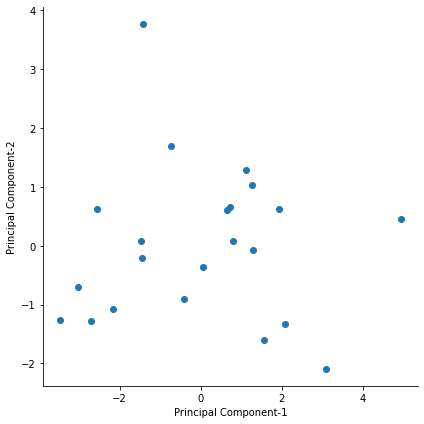

In [ ]:
# Data Visualization after PCA
sns.FacetGrid(df_pca_icheating, height= 6).map(plt.scatter, df_pca_icheating.columns[0], df_pca_icheating.columns[1])
plt.show()

# Modelling

In [ ]:
# define data to build model
x = df_pca_icheating.values



> **Build Model with KMeans**
  
Cluster scenario: 1 to 10



In [ ]:
clusters = []
for clusterpoint in range(1 , 11):
    algorithm = KMeans(n_clusters = clusterpoint).fit(x)
    clusters.append(algorithm.inertia_)



> Selecting N Clusters based in Inertia (Squared Distance between Centroids and data points, should be less)


Hasil:

Optimum di 4





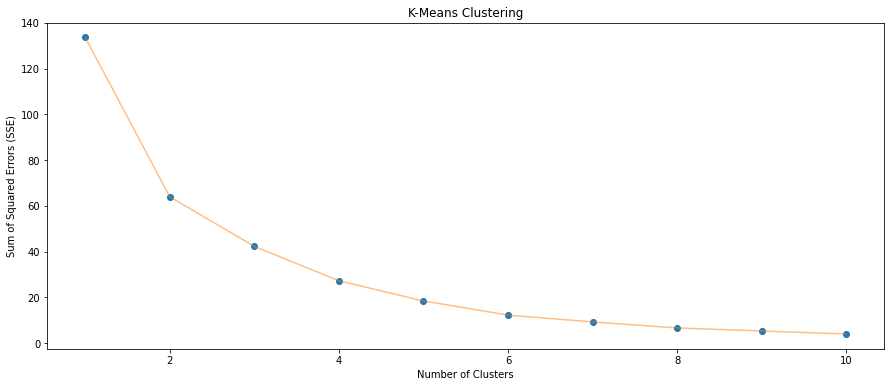

In [ ]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , clusters , 'o')
plt.plot(np.arange(1 , 11) , clusters , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('K-Means Clustering')
plt.show()

In [ ]:
# get each cluster and its SSE
cluster_SSE = pd.concat([pd.DataFrame(np.arange(1,11)), pd.DataFrame(clusters)], axis = 1)
cluster_SSE.columns = ['Cluster', 'Sum Squared of Error']
cluster_SSE

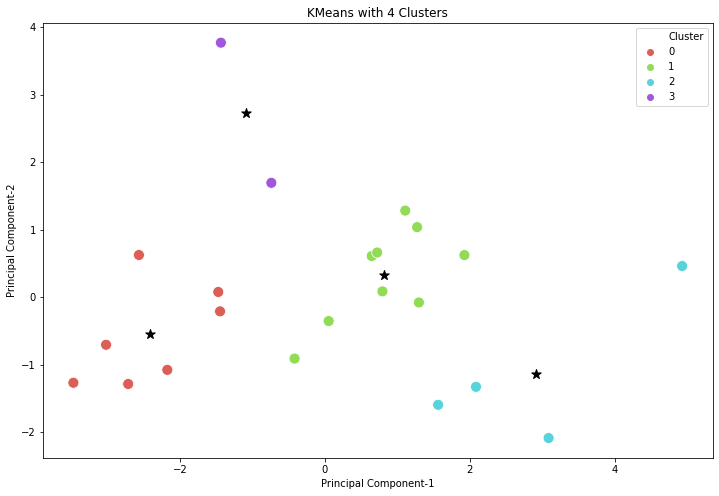

In [ ]:
n_cluster = 4
kmeans_model = KMeans(n_clusters = n_cluster)
kmeans_model.fit_transform(x)

result = df_pca_icheating.copy()
# result = df_pca_icheating_without_outlier.copy()
result['Cluster'] = kmeans_model.labels_

# plot clustering result
plt.figure(figsize=(12, 8))
sns.scatterplot(
    result.iloc[:,0], result.iloc[:,1],
    s = 120,
    hue= result.Cluster, 
    # palette= ['g', 'r', 'b', 'y'])
    palette= sns.color_palette('hls', len(result.Cluster.unique())))

# plot the centroids
centroids = kmeans_model.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker = "*", s = 100, color = 'black')
# define plot title
plt.title('KMeans with 4 Clusters')
plt.show()

In [ ]:
# combine with original data
cluster_result = pd.concat([dataset_konsisten_final, df_pca_icheating], axis = 1)
# cluster_result = pd.concat([dataset_konsisten_final, df_pca_icheating_without_outlier], axis = 1)
# cluster_result.columns.values[-3:] = ['Principal Component-1', 'Principal Component-2', 'Principal Component-3']
cluster_result = cluster_result.dropna()
cluster_result['Cluster'] = result.Cluster
cluster_result.sort_values(by='Cluster' , inplace=True) # ascending order
cluster_result['Cluster'] = cluster_result['Cluster'].map({
    0: 'First',
    1: 'Second',
    2: 'Third',
    3: 'Fourth'
})
cluster_result

,roe,uoe,se,nai,lc,sd,ca,cp,ca1,Principal Component-1,Principal Component-2,Cluster
21,4.25,4.25,1.5,4.0,4.000000,3.0,4.000000,5.000000,5.0,-1.448750,-0.211172,First
19,5.00,5.00,1.0,4.4,5.000000,3.0,5.000000,5.000000,3.0,-2.176969,-1.077924,First
2,5.00,5.00,1.0,5.0,5.000000,1.0,5.000000,5.000000,5.0,-3.474134,-1.268781,First
18,4.50,4.00,2.0,4.0,3.500000,3.0,5.000000,5.000000,5.0,-1.473664,0.075596,First
4,4.00,4.00,2.0,5.0,5.000000,2.0,5.000000,5.000000,5.0,-2.569091,0.623037,First
6,5.00,5.00,1.0,4.4,4.166667,2.0,5.000000,5.000000,5.0,-2.717462,-1.287030,First
14,5.00,5.00,2.0,5.0,5.000000,2.0,5.000000,5.000000,5.0,-3.022671,-0.706225,First
17,4.25,4.25,3.5,3.2,3.833333,4.0,4.000000,4.000000,3.0,0.793264,0.084381,Second
15,2.00,5.00,3.0,2.4,3.500000,3.0,3.000000,4.000000,3.0,1.296549,-0.079950,Second
13,4.25,4.50,2.0,4.2,4.166667,2.0,4.000000,4.333333,2.0,-0.419796,-0.910535,Second


In [ ]:
first_cluster = cluster_result[cluster_result.Cluster == 'First']
second_cluster = cluster_result[cluster_result.Cluster == 'Second']
third_cluster = cluster_result[cluster_result.Cluster == 'Third']
fourth_cluster = cluster_result[cluster_result.Cluster == 'Fourth']

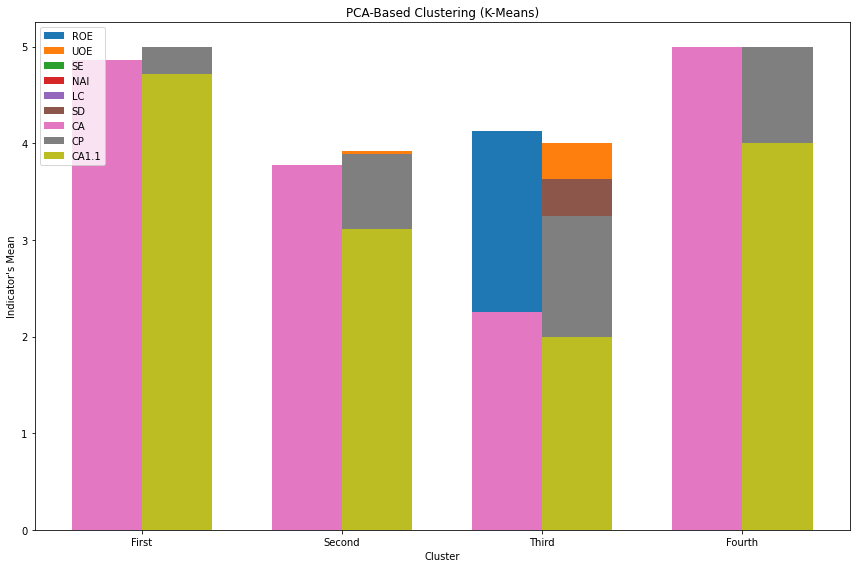

In [ ]:
cluster_label = cluster_result.Cluster.unique()
roe_means = [first_cluster.roe.mean(), second_cluster.roe.mean(), third_cluster.roe.mean(), fourth_cluster.roe.mean()]
uoe_means = [first_cluster.uoe.mean(), second_cluster.uoe.mean(), third_cluster.uoe.mean(), fourth_cluster.uoe.mean()]
se_means = [first_cluster.se.mean(), second_cluster.se.mean(), third_cluster.se.mean(), fourth_cluster.se.mean()]
nai_means = [first_cluster.nai.mean(), second_cluster.nai.mean(), third_cluster.nai.mean(), fourth_cluster.nai.mean()]
lc_means = [first_cluster.lc.mean(), second_cluster.lc.mean(), third_cluster.lc.mean(), fourth_cluster.lc.mean()]
sd_means = [first_cluster.sd.mean(), second_cluster.sd.mean(), third_cluster.sd.mean(), fourth_cluster.sd.mean()]
ca_means = [first_cluster.ca.mean(), second_cluster.ca.mean(), third_cluster.ca.mean(), fourth_cluster.ca.mean()]
cp_means = [first_cluster.cp.mean(), second_cluster.cp.mean(), third_cluster.cp.mean(), fourth_cluster.cp.mean()]
ca1_means = [first_cluster.ca1.mean(), second_cluster.ca1.mean(), third_cluster.ca1.mean(), fourth_cluster.ca1.mean()]

x = np.arange(len(cluster_label))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize =(12, 8))

rects_roe = ax.bar(x - width/2, roe_means, width, label='ROE')
rects_uoe = ax.bar(x + width/2, uoe_means, width, label='UOE')
rects_se = ax.bar(x + width/2, se_means, width, label='SE')
rects_nai = ax.bar(x - width/2, nai_means, width, label='NAI')
rects_lc = ax.bar(x + width/2, lc_means, width, label='LC')
rects_sd = ax.bar(x + width/2, sd_means, width, label='SD')
rects_ca = ax.bar(x - width/2, ca_means, width, label='CA')
rects_cp = ax.bar(x + width/2, cp_means, width, label='CP')
rects_ca1 = ax.bar(x + width/2, ca1_means, width, label='CA1.1')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Indicator\'s Mean')
ax.set_xlabel('Cluster')
ax.set_title('PCA-Based Clustering (K-Means)')
ax.set_xticks(x)
ax.set_xticklabels(cluster_label)
ax.legend()

fig.tight_layout()
plt.show()

In [ ]:
indicator = first_cluster[dataset_konsisten_final.columns].columns
indicator_mean = [first_cluster.roe.mean(), first_cluster.uoe.mean(), first_cluster.se.mean(),
             first_cluster.nai.mean(), first_cluster.lc.mean(), first_cluster.sd.mean(),
             first_cluster.ca.mean(), first_cluster.cp.mean(), first_cluster.ca1.mean(),]

cluster_first = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_first.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_first, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='First Cluster')
fig.show()

Cheating Propensity(CP) sangat tinggi , Cheating Attitude(CA) agak tinggi , dan Cheating Behavior(CA1.1) sangat tinggi

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) dan hal itu sangat didukung oleh lingkungan mereka seperti pergaulan atau tempat mereka belajar/tinggal

In [ ]:
indicator = second_cluster[dataset_konsisten_final.columns].columns
indicator_mean = [second_cluster.roe.mean(), second_cluster.uoe.mean(), second_cluster.se.mean(),
             second_cluster.nai.mean(), second_cluster.lc.mean(), second_cluster.sd.mean(),
             second_cluster.ca.mean(), second_cluster.cp.mean(), second_cluster.ca1.mean()]

cluster_second = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_second.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_second, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='Second Cluster')
fig.show()

Cheating Propensity(CP) sangat tinggi , Cheating Attitude(CA) sangat tinggi , dan Losing Connectedness (LC) sangat tinggi

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) namun yang membedakan dengan cluster pertama adalah dipengaruhi oleh rasa gelisah akan tidak dapat berkomunikasi dengan orang lain

In [ ]:
indicator = third_cluster[dataset_konsisten_final.columns].columns
indicator_mean = [third_cluster.roe.mean(), third_cluster.uoe.mean(), third_cluster.se.mean(),
             third_cluster.nai.mean(), third_cluster.lc.mean(), third_cluster.sd.mean(),
             third_cluster.ca.mean(), third_cluster.cp.mean(), third_cluster.ca1.mean()]

cluster_third = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_third.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_third, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='Third Cluster')
fig.show()

Use of Emotion (UOE) agak tinggi , Cheating Propensity(CP) agak tinggi , dan Cheating Attitude(CA) agak tinggi

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) dan sebenarnya dapat mengontrol emosi dengan sangat baik

In [ ]:
indicator = fourth_cluster[dataset_konsisten_final.columns].columns
indicator_mean = [fourth_cluster.roe.mean(), fourth_cluster.uoe.mean(), fourth_cluster.se.mean(),
             fourth_cluster.nai.mean(), fourth_cluster.lc.mean(), fourth_cluster.sd.mean(),
             fourth_cluster.ca.mean(), fourth_cluster.cp.mean(), fourth_cluster.ca1.mean()]

cluster_fourth = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_fourth.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_fourth, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='Fourth Cluster')
fig.show()

Regulation of Emotion(ROE) agak tinggi , Use of Emotion (UOE) agak tinggi , dan Sleep Disturbance(SD) agak tinggi

    Pada tipe responden ini, bertipe dapat menguasai emosi dengan baik. Akan tetapi memiliki kebiasaan tidur yang cukup buruk sehingga sering telat masuk kelas sehingga menimbulkan rasa ingin mencontek yang tinggi

**KESIMPULAN PENGELOMPOKKAN MENGGUNAKAN K-MEANS**

*   **Tipe Responden 1**
    
    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) dan hal itu sangat didukung oleh lingkungan mereka seperti pergaulan atau tempat mereka belajar/tinggal

*   **Tipe Responden 2**

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) namun yang membedakan dengan cluster pertama adalah dipengaruhi oleh rasa gelisah akan tidak dapat berkomunikasi dengan orang lain

*   **Tipe Responden 3**

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) dan sebenarnya dapat mengontrol emosi dengan sangat baik

*   **Tipe Responden 4**

    Pada tipe responden ini, bertipe dapat menguasai emosi dengan baik. Akan tetapi memiliki kebiasaan tidur yang cukup buruk sehingga sering telat masuk kelas sehingga menimbulkan rasa ingin mencontek yang tinggi



---





> **Build Model with DBSCAN**



Get best epsilon value

Pilih yang lonjakan error setelahnya paling besar

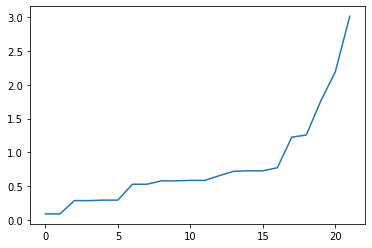

In [ ]:
neigh = NearestNeighbors()
nbrs = neigh.fit(x)
distances, indices = nbrs.kneighbors(x)

# visualize 
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

Hasil:

Lonjakan paling besar terdapat pada epsilon > 1.2

Get optimum minimum sample on each cluster


In [ ]:
min_sample_array = np.arange(1,10)
n_epsilon = 1.2
for sample in min_sample_array:
  print("Current min. sample is: ", sample)
  model = DBSCAN(eps= n_epsilon, min_samples = sample).fit(x)
  core_sample_mask = np.zeros_like(model.labels_, dtype= bool)
  core_sample_mask[model.core_sample_indices_] = True
  labels = set([label for label in model.labels_ if label >= 0])
  print(set(labels))

  print("For min_samples value "+ str(sample), ", total no. of cluster are " + str(len(labels)))

Current min. sample is:  1
{0, 1, 2, 3, 4, 5, 6, 7}
For min_samples value 1 , total no. of cluster are 8
Current min. sample is:  2
{0, 1, 2}
For min_samples value 2 , total no. of cluster are 3
Current min. sample is:  3
{0, 1}
For min_samples value 3 , total no. of cluster are 2
Current min. sample is:  4
{0, 1}
For min_samples value 4 , total no. of cluster are 2
Current min. sample is:  5
{0}
For min_samples value 5 , total no. of cluster are 1
Current min. sample is:  6
{0}
For min_samples value 6 , total no. of cluster are 1
Current min. sample is:  7
{0}
For min_samples value 7 , total no. of cluster are 1
Current min. sample is:  8
set()
For min_samples value 8 , total no. of cluster are 0
Current min. sample is:  9
set()
For min_samples value 9 , total no. of cluster are 0


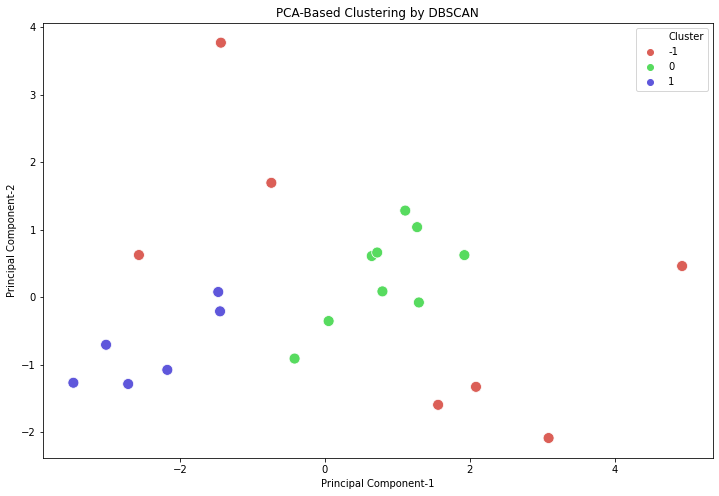

In [ ]:
min_sample = 3
dbscan_model = DBSCAN(eps= n_epsilon, min_samples = min_sample).fit(x)
# dbscan_model = dbscan_model.fit(x)

result_dbscan = df_pca_icheating.copy()
result_dbscan['Cluster'] = dbscan_model.labels_
cluster_result_dbscan = len(result_dbscan.Cluster.unique())
plt.figure(figsize=(12, 8))
sns.scatterplot(
    result_dbscan.iloc[:,0], result_dbscan.iloc[:,1], 
    hue= result_dbscan.Cluster,
    s = 120,
    palette= sns.color_palette('hls', cluster_result_dbscan))
plt.title('PCA-Based Clustering by DBSCAN')
plt.show()

In [ ]:
# combine with original data
cluster_result_dbscan = pd.concat([dataset_konsisten_final, df_pca_icheating], axis = 1)
cluster_result_dbscan['Cluster'] = result_dbscan.Cluster
cluster_result_dbscan = cluster_result_dbscan.dropna()
cluster_result_dbscan.sort_values(by='Cluster' , inplace=True)
cluster_result_dbscan['Cluster'] = cluster_result_dbscan['Cluster'].map({
    -1: 'First',
    0: 'Second',
    1: 'Third'
})
cluster_result_dbscan

,roe,uoe,se,nai,lc,sd,ca,cp,ca1,Principal Component-1,Principal Component-2,Cluster
1,3.75,4.00,4.0,4.8,4.833333,4.5,5.000000,5.000000,3.0,-0.740522,1.692261,First
3,1.00,3.00,1.0,5.0,5.000000,5.0,5.000000,5.000000,5.0,-1.437466,3.767490,First
4,4.00,4.00,2.0,5.0,5.000000,2.0,5.000000,5.000000,5.0,-2.569091,0.623037,First
16,3.75,5.00,2.0,1.4,3.166667,3.5,2.666667,4.000000,3.0,1.562506,-1.595558,First
7,4.50,4.50,1.5,1.6,1.833333,4.5,1.666667,3.666667,2.0,3.087813,-2.087480,First
8,4.75,4.00,2.5,2.4,3.666667,3.0,2.666667,3.333333,1.5,2.085204,-1.329276,First
9,3.50,2.50,4.0,2.0,2.166667,3.5,2.000000,2.000000,1.5,4.931494,0.459871,First
0,4.50,3.00,3.5,2.4,1.833333,4.5,4.666667,4.000000,3.5,1.925270,0.621619,Second
17,4.25,4.25,3.5,3.2,3.833333,4.0,4.000000,4.000000,3.0,0.793264,0.084381,Second
15,2.00,5.00,3.0,2.4,3.500000,3.0,3.000000,4.000000,3.0,1.296549,-0.079950,Second


In [ ]:
first_cluster_dbscan = cluster_result_dbscan[cluster_result_dbscan['Cluster'] == 'First']
second_cluster_dbscan = cluster_result_dbscan[cluster_result_dbscan['Cluster'] == 'Second']
third_cluster_dbscan = cluster_result_dbscan[cluster_result_dbscan['Cluster'] == 'Third']

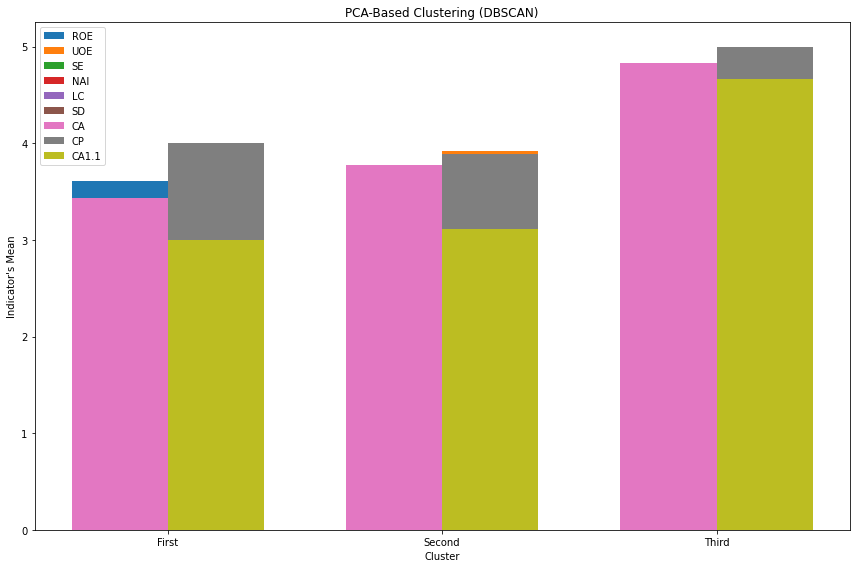

In [ ]:
cluster_label = cluster_result_dbscan.Cluster.unique()
roe_means = [first_cluster_dbscan.roe.mean(), second_cluster_dbscan.roe.mean(), third_cluster_dbscan.roe.mean()]
uoe_means = [first_cluster_dbscan.uoe.mean(), second_cluster_dbscan.uoe.mean(), third_cluster_dbscan.uoe.mean()]
se_means = [first_cluster_dbscan.se.mean(), second_cluster_dbscan.se.mean(), third_cluster_dbscan.se.mean()]
nai_means = [first_cluster_dbscan.nai.mean(), second_cluster_dbscan.nai.mean(), third_cluster_dbscan.nai.mean()]
lc_means = [first_cluster_dbscan.lc.mean(), second_cluster_dbscan.lc.mean(), third_cluster_dbscan.lc.mean()]
sd_means = [first_cluster_dbscan.sd.mean(), second_cluster_dbscan.sd.mean(), third_cluster_dbscan.sd.mean()]
ca_means = [first_cluster_dbscan.ca.mean(), second_cluster_dbscan.ca.mean(), third_cluster_dbscan.ca.mean()]
cp_means = [first_cluster_dbscan.cp.mean(), second_cluster_dbscan.cp.mean(), third_cluster_dbscan.cp.mean()]
ca1_means = [first_cluster_dbscan.ca1.mean(), second_cluster_dbscan.ca1.mean(), third_cluster_dbscan.ca1.mean()]

xaxis = np.arange(len(cluster_label))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize =(12, 8))

rects_roe = ax.bar(xaxis - width/2, roe_means, width, label='ROE')
rects_uoe = ax.bar(xaxis + width/2, uoe_means, width, label='UOE')
rects_se = ax.bar(xaxis + width/2, se_means, width, label='SE')
rects_nai = ax.bar(xaxis - width/2, nai_means, width, label='NAI')
rects_lc = ax.bar(xaxis + width/2, lc_means, width, label='LC')
rects_sd = ax.bar(xaxis + width/2, sd_means, width, label='SD')
rects_ca = ax.bar(xaxis - width/2, ca_means, width, label='CA')
rects_cp = ax.bar(xaxis + width/2, cp_means, width, label='CP')
rects_ca1 = ax.bar(xaxis + width/2, ca1_means, width, label='CA1.1')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Indicator\'s Mean')
ax.set_xlabel('Cluster')
ax.set_title('PCA-Based Clustering (DBSCAN)')
ax.set_xticks(xaxis)
ax.set_xticklabels(cluster_label)
ax.legend()

# def autolabel(rects):
#     """Attach a text label above each bar in *rects*, displaying its height."""
#     for rect in rects:
#         height = rect.get_height()
#         ax.annotate('{}'.format(height),
#                     xy=(rect.get_x() + rect.get_width() / 2, height),
#                     xytext=(0, 3),  # 3 points vertical offset
#                     textcoords="offset points",
#                     ha='center', va='bottom')


# autolabel(rects_roe)
# autolabel(rects_uoe)
# autolabel(rects_se)
# autolabel(rects_nai)
# autolabel(rects_lc)
# autolabel(rects_sd)
# autolabel(rects_ca)
# autolabel(rects_cp)
# autolabel(rects_ca1)

fig.tight_layout()
plt.show()

In [ ]:
indicator = first_cluster_dbscan[dataset_konsisten_final.columns].columns
indicator_mean = [first_cluster_dbscan.roe.mean(), first_cluster_dbscan.uoe.mean(), first_cluster_dbscan.se.mean(),
             first_cluster_dbscan.nai.mean(), first_cluster_dbscan.lc.mean(), first_cluster_dbscan.sd.mean(),
             first_cluster_dbscan.ca.mean(), first_cluster_dbscan.cp.mean(), first_cluster_dbscan.ca1.mean(),]

cluster_first_dbscan = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_first_dbscan.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_first_dbscan, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='Cluster 1')
fig.show()

Cheating Propensity(CP) sedang , Use of Emotion(UOE) rendah , dan Sleep Disturbance(SD) tinggi

    Pada tipe responden ini, mereka memiliki gangguan tidur yang tinggi seperti sering terlambat masuk kelas sehingga proses belajar mengajar di dalam kelas terganggu dan tidak dapat memahami materi pelajaran. Lalu menimbulkan keinginan untuk mencontek ketika ujian. Responden ini juga tidak terlalu bisa mengontrol emosi dengan baik

In [ ]:
indicator = second_cluster_dbscan[dataset_konsisten_final.columns].columns
indicator_mean = [second_cluster_dbscan.roe.mean(), second_cluster_dbscan.uoe.mean(), second_cluster_dbscan.se.mean(),
             second_cluster_dbscan.nai.mean(), second_cluster_dbscan.lc.mean(), second_cluster_dbscan.sd.mean(),
             second_cluster_dbscan.ca.mean(), second_cluster_dbscan.cp.mean(), second_cluster_dbscan.ca1.mean()]

cluster_second_dbscan = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_second_dbscan.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_second_dbscan, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='Cluster 2')
fig.show()

Use of Emotion(UOE) sedang , Cheating Prospensity(CP) rendah , dan Cheating Attitude (CA) sedang

    Pada tipe responden ini, mereka lebih dapat memotivasi diri untuk menjadi lebih baik namun yang menjadi catatan adalah sikap mereka dalam menyikapi mencontek yang cukup tinggi. Walaupun sikap mencontek mereka yang cukup tinggi, hal tersebut tidak menimbulkan rasa ingin mencontek yang tinggi pula

In [ ]:
indicator = third_cluster_dbscan[dataset_konsisten_final.columns].columns
indicator_mean = [third_cluster_dbscan.roe.mean(), third_cluster_dbscan.uoe.mean(), third_cluster_dbscan.se.mean(),
             third_cluster_dbscan.nai.mean(), third_cluster_dbscan.lc.mean(), third_cluster_dbscan.sd.mean(),
             third_cluster_dbscan.ca.mean(), third_cluster_dbscan.cp.mean(), third_cluster_dbscan.ca1.mean()]

cluster_third_dbscan = pd.DataFrame({'Indicator': indicator, 'Indicator Value': indicator_mean})
cluster_third_dbscan.sort_values('Indicator Value', axis = 0, ascending = True, inplace= True)
fig = px.bar(cluster_third_dbscan, x='Indicator', y='Indicator Value', text='Indicator Value')
fig.update_layout(title_text='Cluster 3')
fig.show()

Cheating Propensity(CP) tinggi  , Cheating Attitude(CA) tinggi , Regulation of Emotion (ROE) tinggi

    Pada tipe responden ini, mereka memiliki sikap dan keinginan mencontek yang sangat tinggi walaupun sebenarnya mereka dapat mengatur emosi dengan baik

**KESIMPULAN PENGELOMPOKKAN MENGGUNAKAN DBSCAN**

*   **Tipe Responden 1**
    
    Pada tipe responden ini, mereka memiliki gangguan tidur yang tinggi seperti sering terlambat masuk kelas sehingga proses belajar mengajar di dalam kelas terganggu dan tidak dapat memahami materi pelajaran. Lalu menimbulkan keinginan untuk mencontek ketika ujian. Responden ini juga tidak terlalu bisa mengontrol emosi dengan baik

*   **Tipe Responden 2**

    Pada tipe responden ini, mereka lebih dapat memotivasi diri untuk menjadi lebih baik namun yang menjadi catatan adalah sikap mereka dalam menyikapi mencontek yang cukup tinggi. Walaupun sikap mencontek mereka yang cukup tinggi, hal tersebut tidak menimbulkan rasa ingin mencontek yang tinggi pula

*   **Tipe Responden 3**

    Pada tipe responden ini, mereka memiliki sikap dan keinginan mencontek yang sangat tinggi walaupun sebenarnya mereka dapat mengatur emosi dengan baik

# Kesimpulan



> Segmentasi Responden



**KESIMPULAN PENGELOMPOKKAN MENGGUNAKAN K-MEANS**

*   **Tipe Responden 1**
    
    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) dan hal itu sangat didukung oleh lingkungan mereka seperti pergaulan atau tempat mereka belajar/tinggal

*   **Tipe Responden 2**

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) namun yang membedakan dengan cluster pertama adalah dipengaruhi oleh rasa gelisah akan tidak dapat berkomunikasi dengan orang lain

*   **Tipe Responden 3**

    Pada tipe responden ini, mereka memiliki sikap serta keinginan yang kuat untuk melakukan kecurangan(mencontek) dan sebenarnya dapat mengontrol emosi dengan sangat baik

*   **Tipe Responden 4**

    Pada tipe responden ini, bertipe dapat menguasai emosi dengan baik. Akan tetapi memiliki kebiasaan tidur yang cukup buruk sehingga sering telat masuk kelas sehingga menimbulkan rasa ingin mencontek yang tinggi

**KESIMPULAN PENGELOMPOKKAN MENGGUNAKAN DBSCAN**

*   **Tipe Responden 1**
    
    Pada tipe responden ini, mereka memiliki gangguan tidur yang tinggi seperti sering terlambat masuk kelas sehingga proses belajar mengajar di dalam kelas terganggu dan tidak dapat memahami materi pelajaran. Lalu menimbulkan keinginan untuk mencontek ketika ujian. Responden ini juga tidak terlalu bisa mengontrol emosi dengan baik

*   **Tipe Responden 2**

    Pada tipe responden ini, mereka lebih dapat memotivasi diri untuk menjadi lebih baik namun yang menjadi catatan adalah sikap mereka dalam menyikapi mencontek yang cukup tinggi. Walaupun sikap mencontek mereka yang cukup tinggi, hal tersebut tidak menimbulkan rasa ingin mencontek yang tinggi pula

*   **Tipe Responden 3**

    Pada tipe responden ini, mereka memiliki sikap dan keinginan mencontek yang sangat tinggi walaupun sebenarnya mereka dapat mengatur emosi dengan baik

**KESIMPULAN YANG DAPAT DIAMBIL**

Dari kedua metode yang diujicoba, terdapat persamaan indikator yang dominan yaitu Cheating Prospensity(Rasa ingin mencontek) dan Cheating Attitude(Sikap ingin mencontek (?) )



> Rekomendasi yang Dapat Diberikan Menurut Responden



In [ ]:
(Lihat section Exploratory Data Analysis - Descriptive Question)